# Batch processing for meditation recordings
## Facultad de Ciencias, UNAM
### Ana Daniela del Río Pulido and Erin C. McKiernan

Functions used in previous notebooks will be used.

If you are in this notebook, I guess you have passed through the previous techniques. In this notebook, we will see the effects of medidation techniques with different techniques.

# Setting up the notebook

We begin by setting up the Jupyter notebook and importing the Python modules needed for plotting figures, create animations, etc. We include commands to view plots in the Jupyter notebook, and to create figures with good resolution and large labels. These commands can be customized to produce figures with other specifications.

In [6]:
# Imports python libraries
import numpy as np
import random as rd
import wave
import sys
import os
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import matplotlib as mpl
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
sys.path.insert(1, r'./../functions') # add to pythonpath

# commands to create high-resolution figures with large labels
%config InlineBackend.figure_formats = {'png', 'retina'} 
plt.rcParams['figure.dpi'] = 50
plt.rcParams['axes.labelsize'] = 16 # fontsize for figure labels
plt.rcParams['axes.titlesize'] = 18 # fontsize for figure titles
plt.rcParams['font.size'] = 14 # fontsize for figure numbers
plt.rcParams['lines.linewidth'] = 1.4 # line width for plotting

## Extracting data

ECG recordings were obtained using the Backyard Brains Heart and Brain Spiker Box. The recordings are saved as audio files in .wav format. The first thing we have to do is open the .wav files and extract the data. We can extract the number of recording channels, sampling rate, etc.

In [7]:
#Function that extracts the number of recording channels, sampling rate, time and signal
#variable is the path and filename of the .wav file
def ecg(variable):
    record = wave.open(variable, 'r') # load the data

    # Get the number of channels, sample rate, etc.
    numChannels = record.getnchannels() #number of channels
    numFrames = record.getnframes() #number of frames
    sampleRate = record.getframerate() #sampling rate
    sampleWidth = record.getsampwidth()
    
    # Get wave data
    dstr = record.readframes(numFrames * numChannels)
    waveData = np.frombuffer(dstr, np.int16)

    # Get time window
    timeECG = np.linspace(0, len(waveData)/sampleRate, num=len(waveData))

    return timeECG, waveData

# R peaks

Function for detecting R peaks. We will be able to calculate the heart frequency and R-R intervals.

The following function creates an array of values which surpass a certain threshold. Afterwards, it determines the maximum value of this array and adds it in the R-vector. And this is repeated until the end of the time series.

In [8]:
def detecta_maximos_locales(timeECG, waveData, threshold_ratio=0.7):
    # If not all the R peaks are detected, lower the threshold_ratio
    # If components that are not R peaks (like T waves) are detected, higher the threshold_ratio

    if len(timeECG) != len(waveData): #Raises an error if the two arrays have different lengths
        raise Exception("The two arrays have different lengths.")
    
    interval = max(waveData) - min(waveData)
    threshold = threshold_ratio*interval + min(waveData)
    maxima = []
    maxima_indices = []
    mxs_indices = []
    banner = False
    
    for i in range(0, len(waveData)):
            
        if waveData[i] >= threshold:#If a threshold value is surpassed,
            # the indices and values are saved 
            banner = True
            maxima_indices.append(i)
            maxima.append(waveData[i])
            
        elif banner == True and waveData[i] < threshold: #If the threshold value is crossed
            # the index of the maximum value in the original array is saved
            index_local_max = maxima.index(max(maxima))
            mxs_indices.append(maxima_indices[index_local_max])
            maxima = []
            maxima_indices = []
            banner = False     

    return mxs_indices

In [9]:
# If the input of this function is time, the intervals will be given in those same units
# Obtaining the indexes at which the R peaks occur.
def R_intervals(time_indices):
    
    length = len(time_indices)
    intervals = np.zeros(length-1)

    for i in range(0, length-1):
        intervals[i] = time_indices[i+1]-time_indices[i]
    
    return intervals

In [10]:
# def local_mins(waveData, mxs_indices, n =700):
#     mins_vec = []

#     for R_peak_i in mxs_indices: #Aqui estaba el error
#         left_interval = waveData[R_peak_i-n:R_peak_i]
#         right_interval = waveData[R_peak_i:R_peak_i+n]

#         mins_vec.append(R_peak_i - n + (list(left_interval).index(min(left_interval))) )
#         mins_vec.append(R_peak_i + (list(right_interval).index(min(right_interval))) )
        
#     return mins_vec

# Comencing the analysis

For analyzing several recordings at the same time, we must obtain the names of every file. One option is to extract the file names one by one, but another option is just to give a folder's name and extract the recordings from there. 

In [11]:
InputPath = "ECG_samples/meditation_data/" #Folder where the original files are
recordings_path = []
corresponding_folder = []

#In this case, files must be inside folders inside the folder where this notebook is
TheList = os.listdir(InputPath)

for Folder in TheList:
    
    for TheFile in os.listdir(InputPath+Folder):
        corresponding_folder.append(Folder)
        TheFileName, TheFileExtension = os.path.splitext(TheFile) # breaks file name into pieces based on periods

        InputFilePath = InputPath + Folder +"/"+ TheFileName + TheFileExtension # Full path to file

        if (TheFileExtension==".wav"): # Only interested in .wav files
            recordings_path.append(InputFilePath)

Notice that in Option 2 it is important that the recordings appear in any order, but in the same one in both lists: ``subject_rest`` and ``subject_exer``. It cannot happen that the first entry of the first list is ``"subjectA_rest"`` and the second list is ``"subjectC_exer"``.

Now we introduce an object. Notice that in this notebook we are dealing with t
This is because we are dealing with several subjects and each of them has the same properties: an electrocardiogram recording at rest, an electrocardiogram after performing exercise. And these two recordings have other properties related with them like R-R intervals and time when these R peaks happen. Instead of dealing with several arrays, an object is a data structure that could help you organize the data better.

In [12]:
# Object
class Sujeto:
  def __init__(self, timeECG, waveData):
    #Rest
    self.timeECG = timeECG
    self.waveData = waveData
    
    self.mxs_indices = detecta_maximos_locales(timeECG, waveData)    
    self.xx = R_intervals(timeECG[self.mxs_indices])
    self.timeRpeaks = timeECG[self.mxs_indices]

In [13]:
recordings = []

for i in range(0, len(recordings_path)):
    timeECG, waveData = ecg(recordings_path[i])
    recordings.append(Sujeto(timeECG, waveData))
    print("Finished recording ", i+1)

Finished recording  1
Finished recording  2
Finished recording  3
Finished recording  4
Finished recording  5
Finished recording  6
Finished recording  7
Finished recording  8
Finished recording  9
Finished recording  10
Finished recording  11
Finished recording  12
Finished recording  13
Finished recording  14
Finished recording  15
Finished recording  16
Finished recording  17


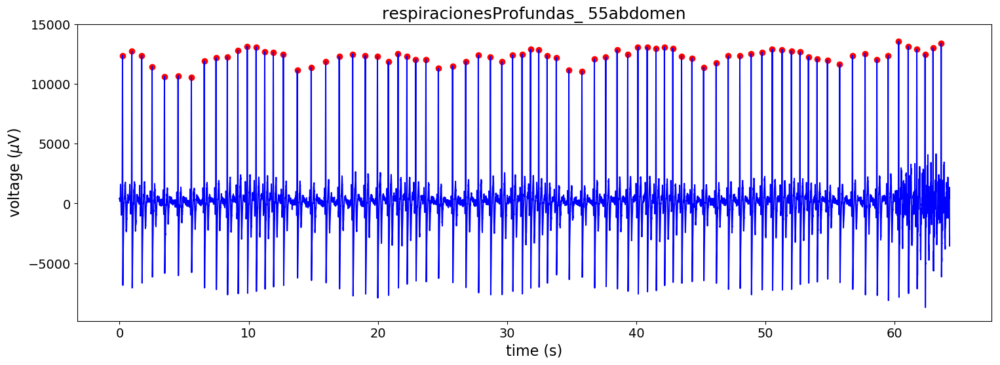

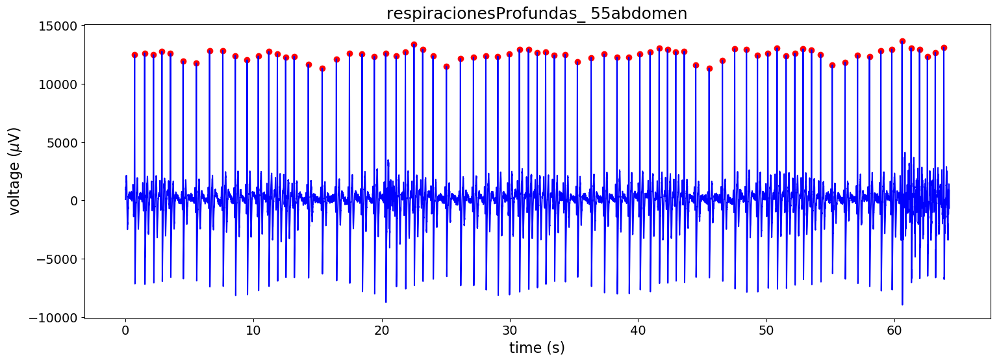

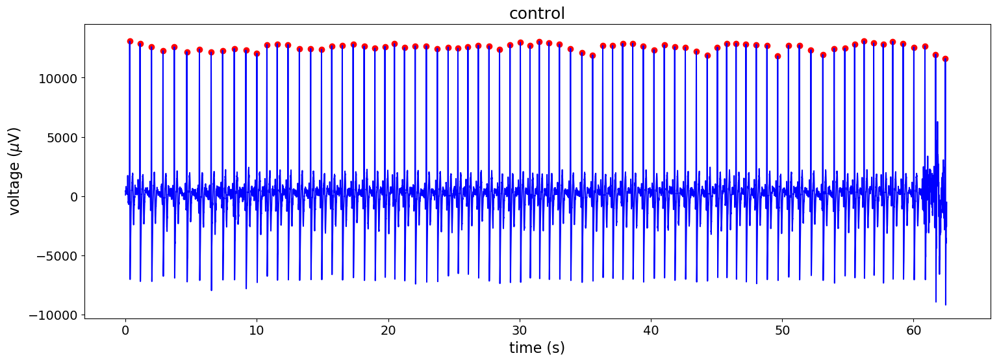

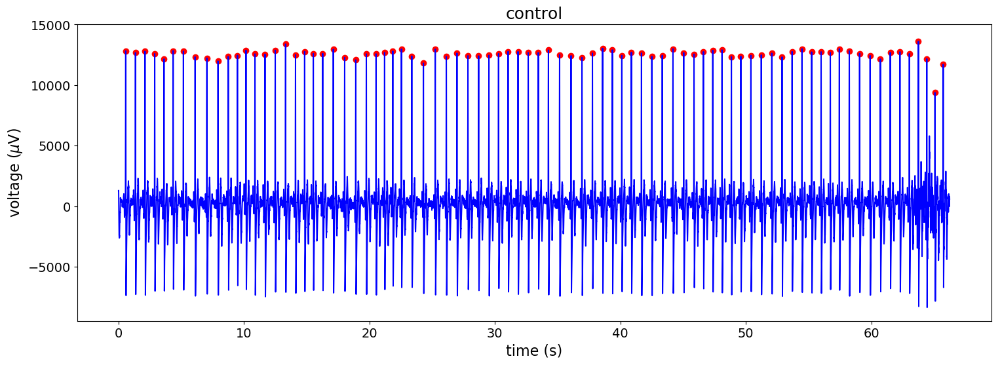

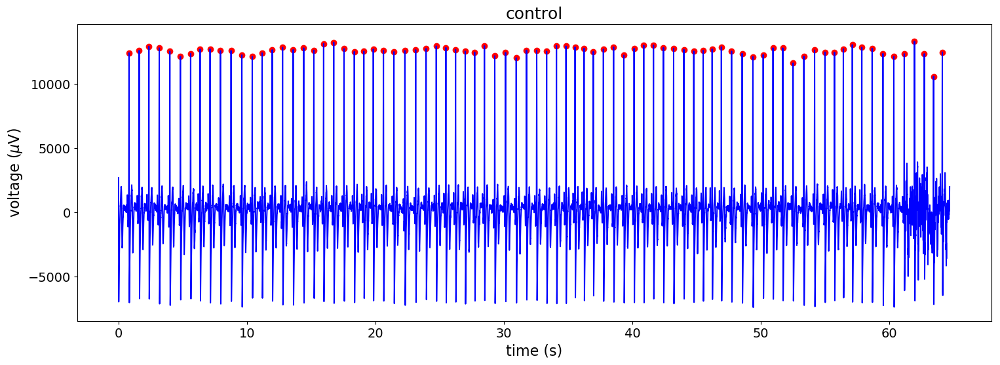

...

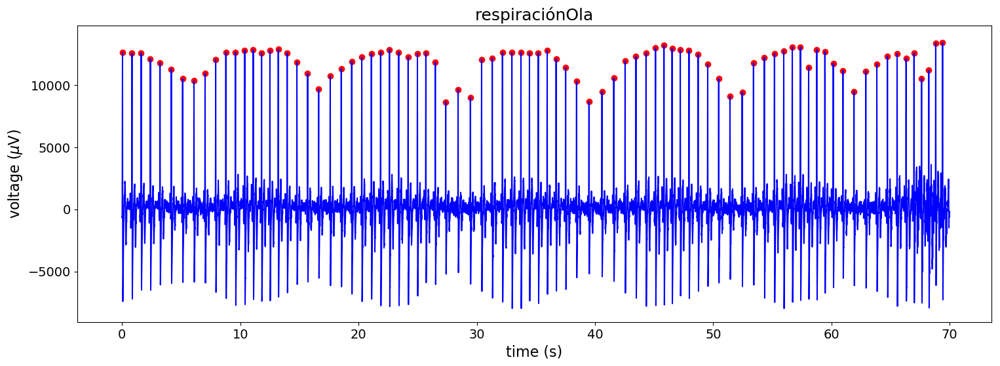

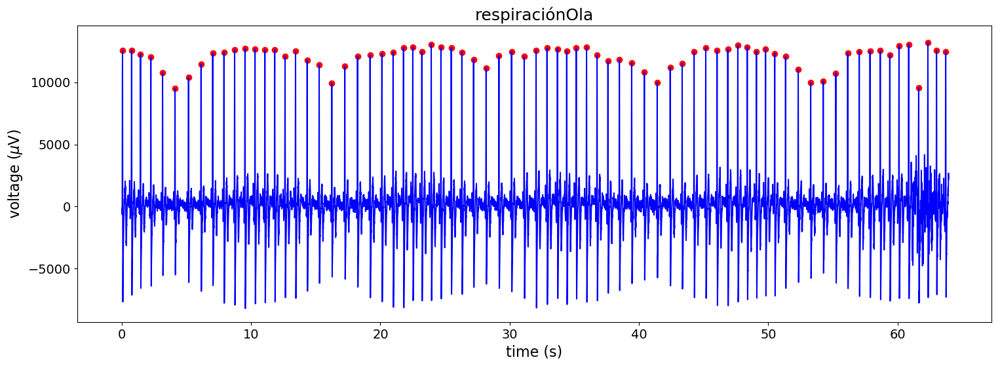

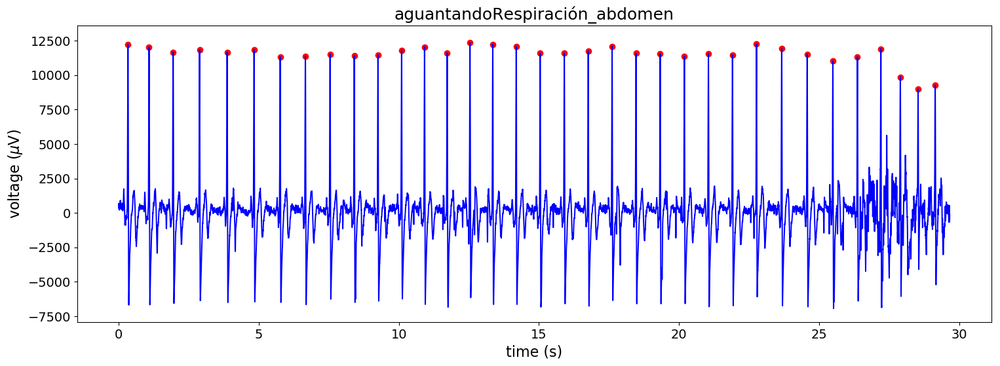

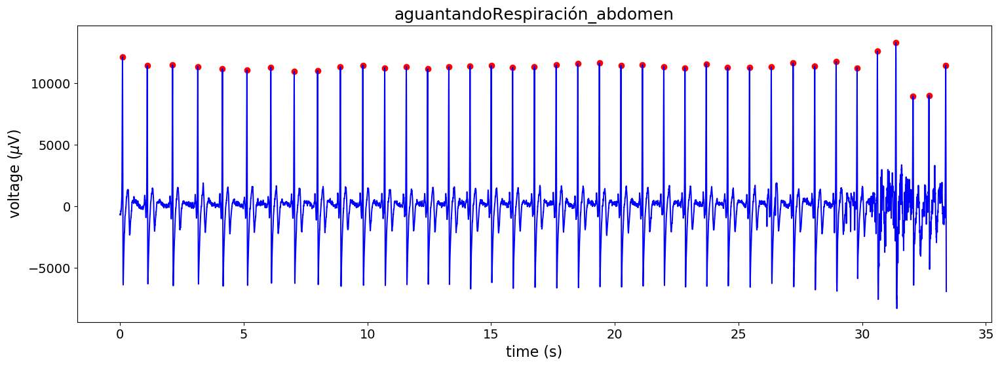

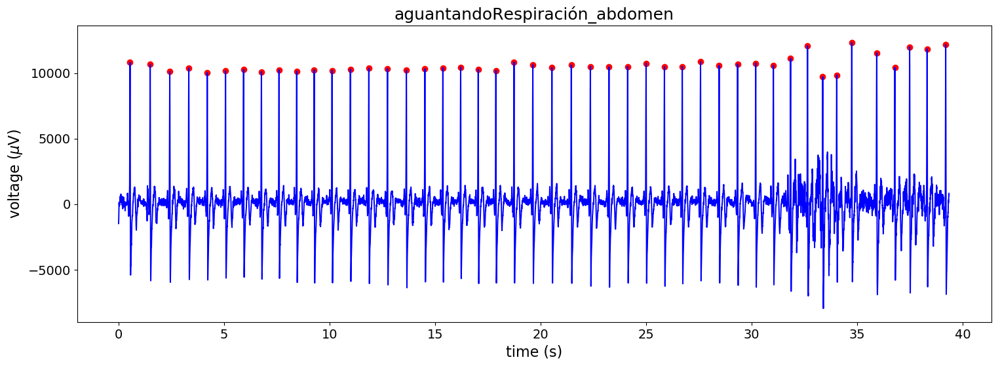

In [14]:
# Plotting ECG signal
for i in range(0, len(recordings)):
    plt.figure(figsize=(18,6))
    plt.xlabel(r'time (s)')
    plt.ylabel(r'voltage ($\mu$V)')
    plt.plot(recordings[i].timeECG, recordings[i].waveData, 'b')
    plt.scatter(recordings[i].timeECG[recordings[i].mxs_indices],
                recordings[i].waveData[recordings[i].mxs_indices],
                color='r')
    plt.title(corresponding_folder[i])
    plt.show()

Is there a bad peak detection in the previous recordings? If there is, exclude that recording, if not, let's continue.

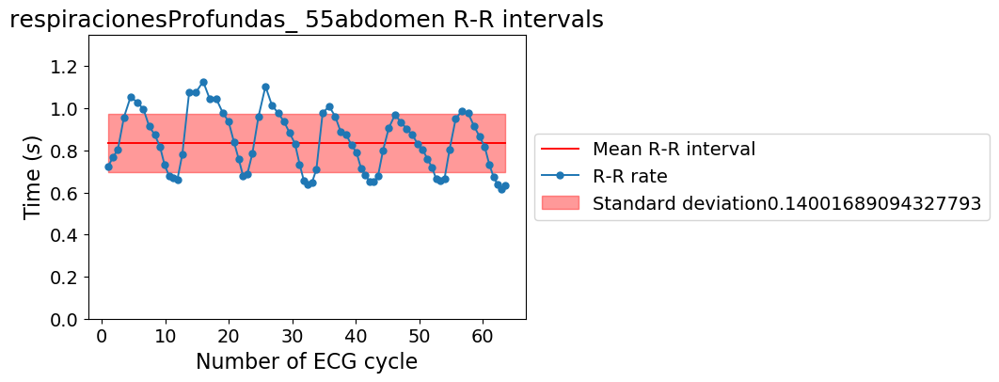

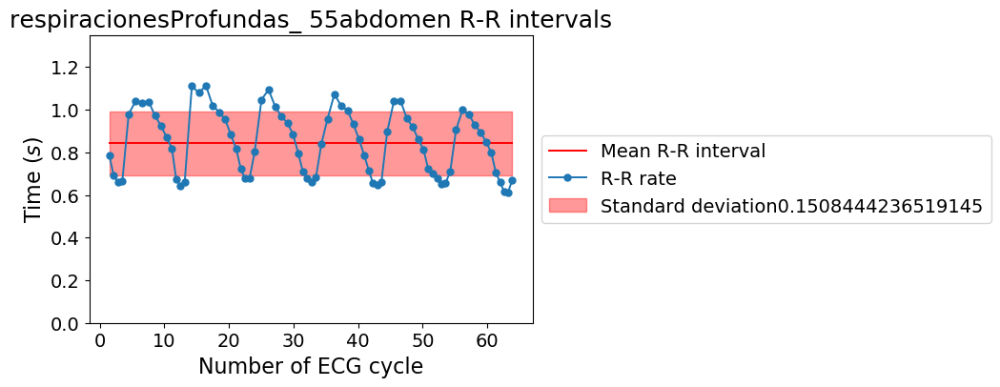

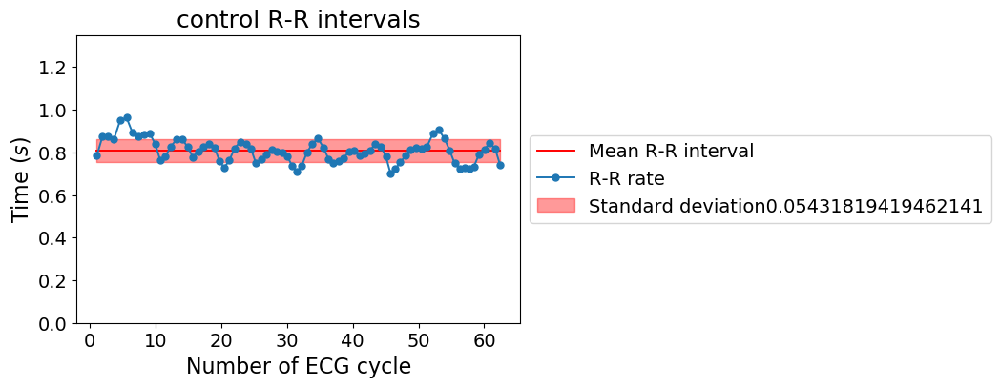

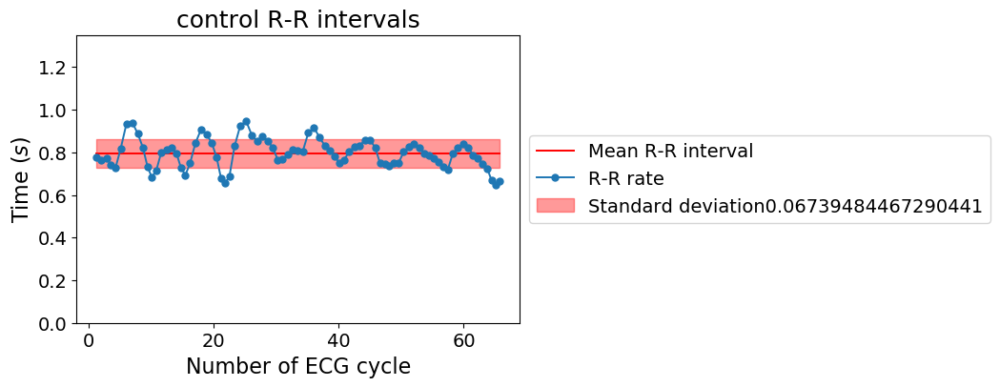

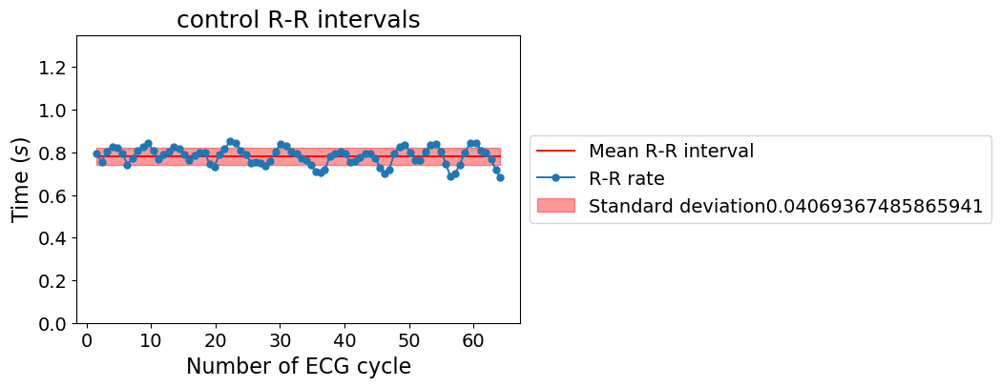

...

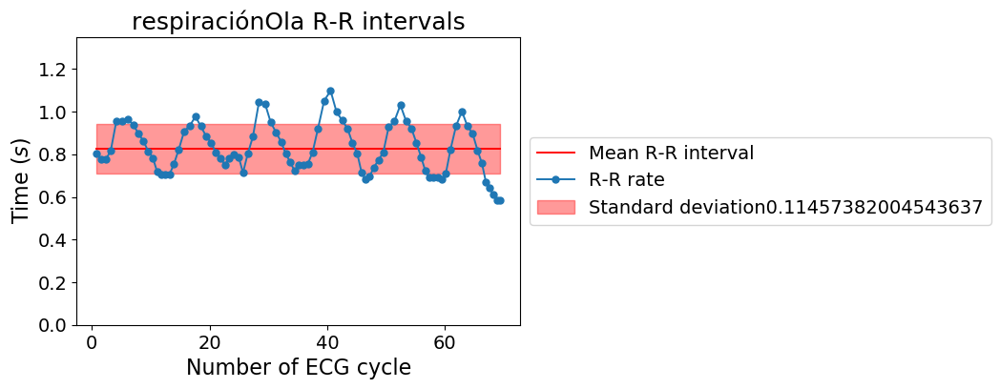

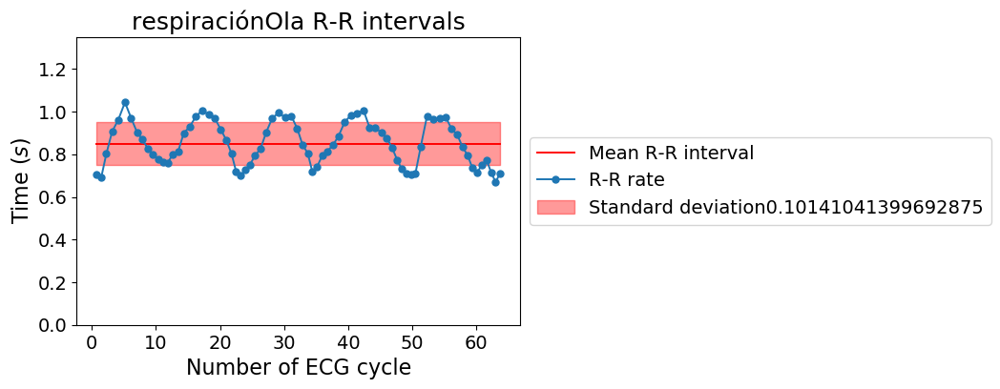

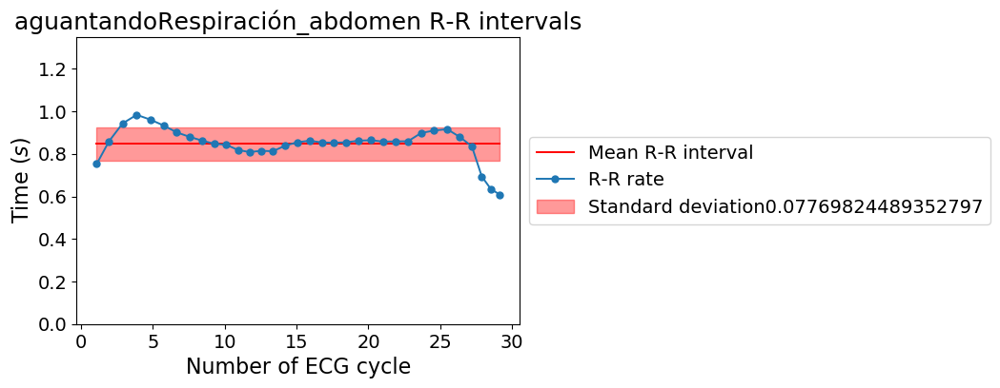

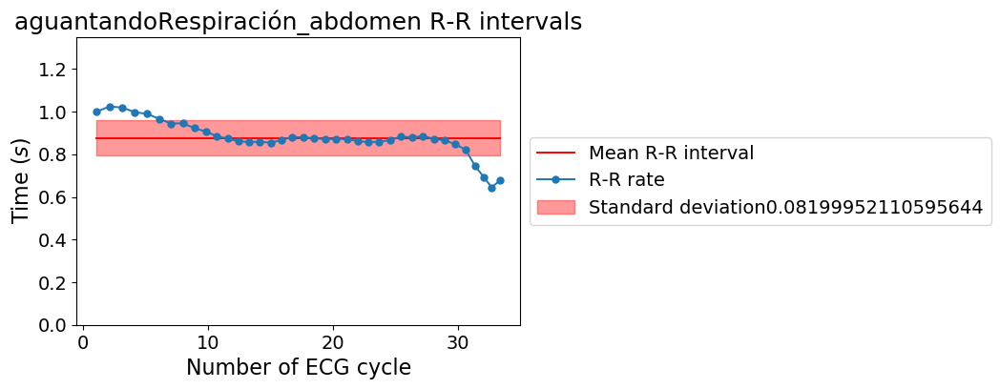

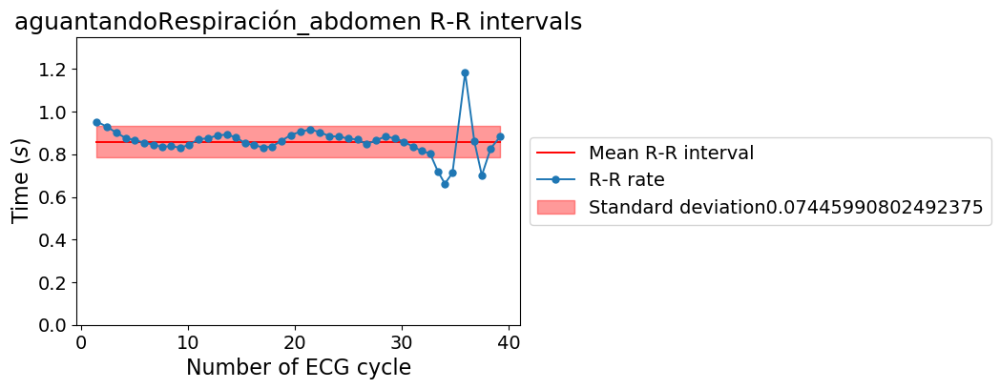

In [15]:
for i in range(len(recordings)):
    mean_rr = np.mean(recordings[i].xx)
    stdev = np.std(recordings[i].xx)
    
    mean_vec = [mean_rr for i in range(0, len(recordings[i].timeRpeaks)-1)]
    std_vec_plus = [mean_rr + stdev for i in range(0, len(recordings[i].timeRpeaks)-1)]
    std_vec_minus = [mean_rr - stdev for i in range(0, len(recordings[i].timeRpeaks)-1)]
         
    
    plt.fill_between(recordings[i].timeRpeaks[1:], std_vec_minus,
                     std_vec_plus, facecolor="red",
                     label = "Standard deviation"+str(stdev), color='red', alpha=0.4)
    plt.plot(recordings[i].timeRpeaks[1:], mean_vec,
             c="r", label = "Mean R-R interval")
    plt.plot(recordings[i].timeRpeaks[1:], recordings[i].xx,
             markersize=5, marker = "o", label="R-R rate")

    plt.ylim((0, 1.35))
    plt.title(corresponding_folder[i] + " R-R intervals")
    plt.xlabel(r'Number of ECG cycle')
    plt.ylabel(r'Time ($s$)')
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
    plt.show()

Notice how the R-R rate is modulated by the breathing frequency. Besides, notice the standard deviation. When comparing the control to meditation techniques without controlling breathing frequency, the standard deviation is greater. It seems there is no substantial change when comparing control with meditation techniques of holding the breath.

# Poincaré plots

We already have the ``mxs_indices`` which correspond to the R-peaks, and ``xx`` corresponds to the R intervals. With this information, we can make a plot where we compare each one of these peaks to the next one. As this technique uses the R-R interval time series, we will only use recordings of subjects 1, 2 and 3.

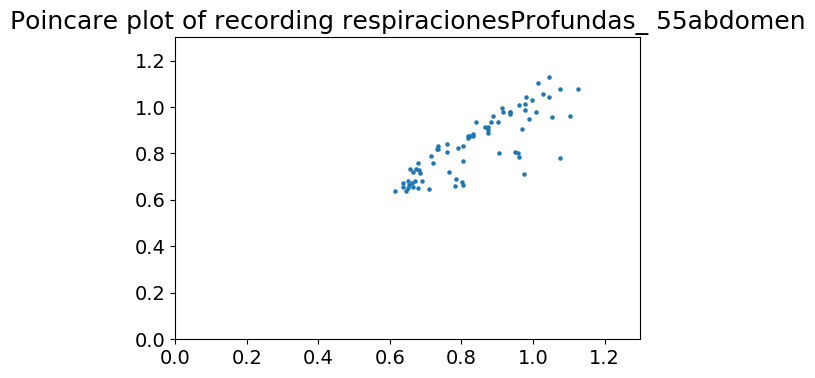

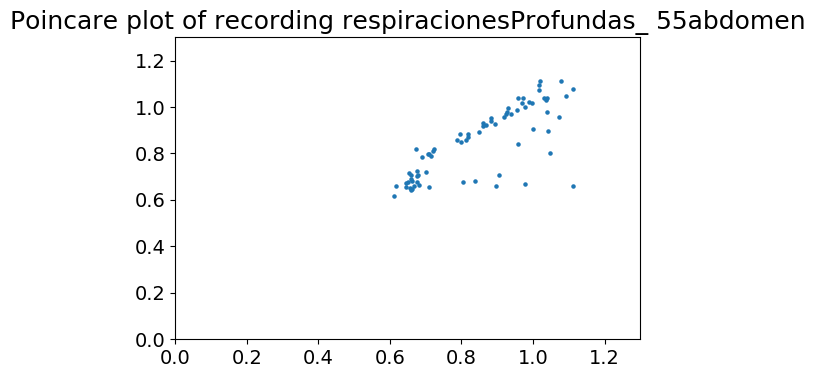

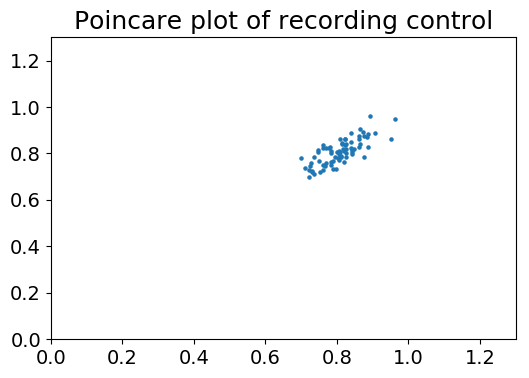

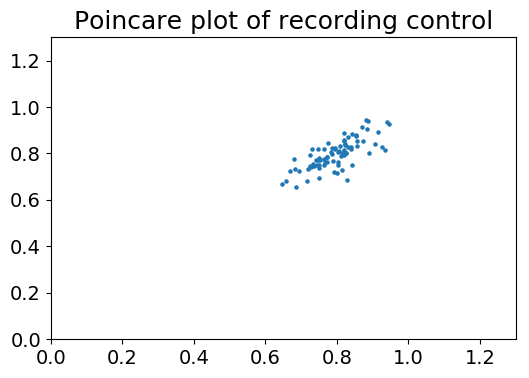

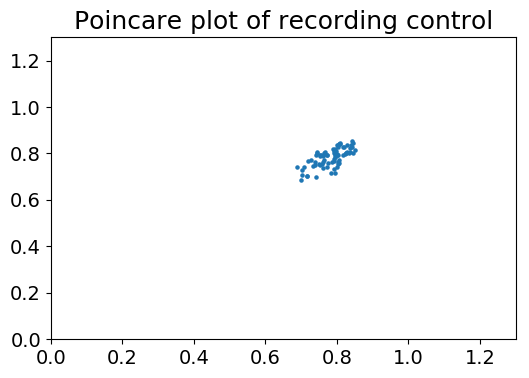

...

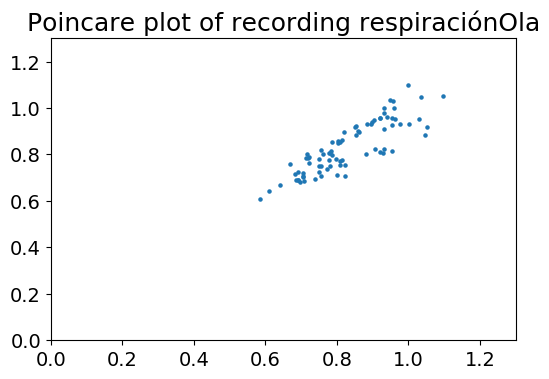

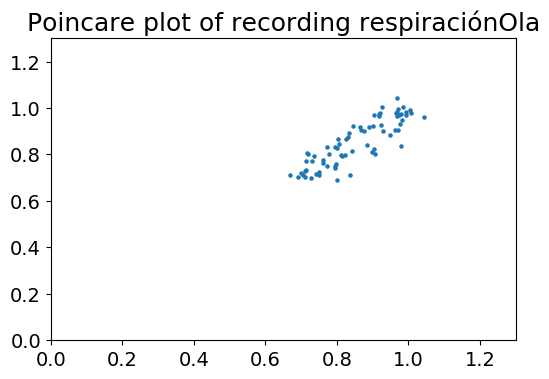

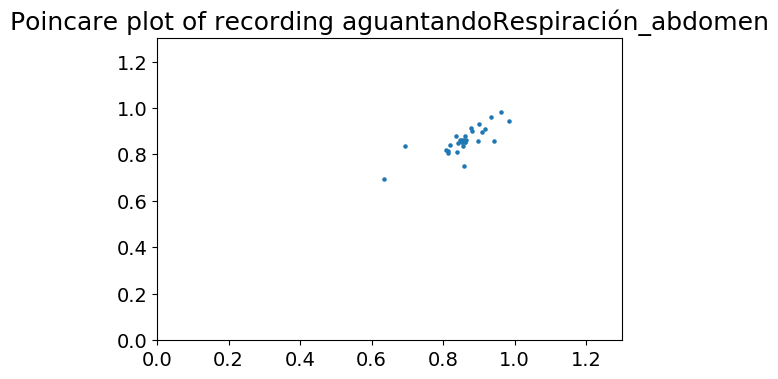

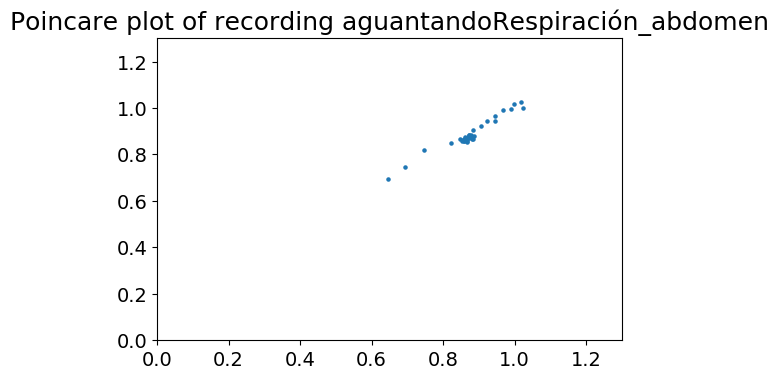

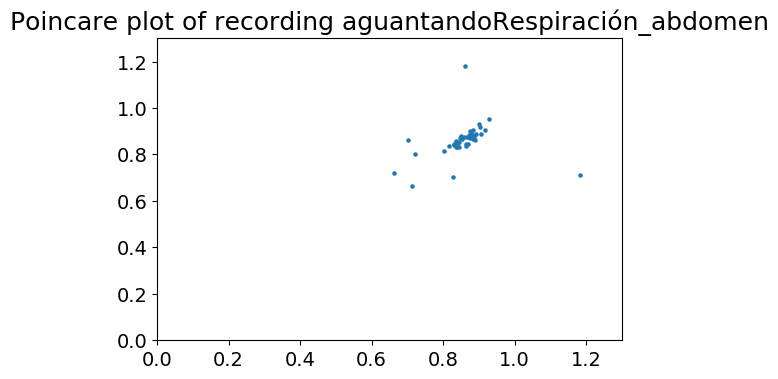

In [17]:
for i in range(len(recordings)):
    plt.scatter(recordings[i].xx[1:-1], recordings[i].xx[:-2],
                s = 5)
    plt.title("Poincare plot of recording " + corresponding_folder[i])
    plt.xlim(0,1.3)
    plt.ylim(0,1.3)
    plt.show()

What if we plot the same kind of recording with the same color and compare between different types of recordings?

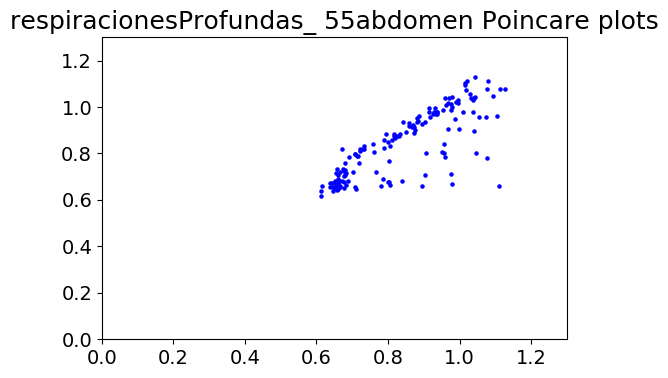

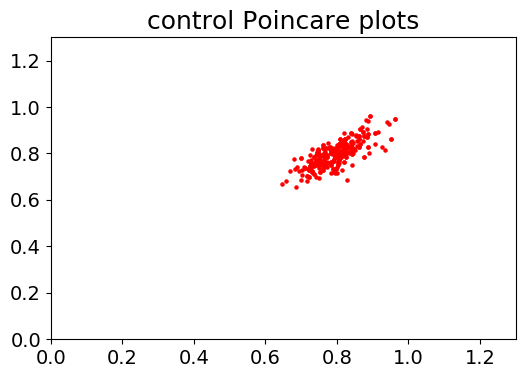

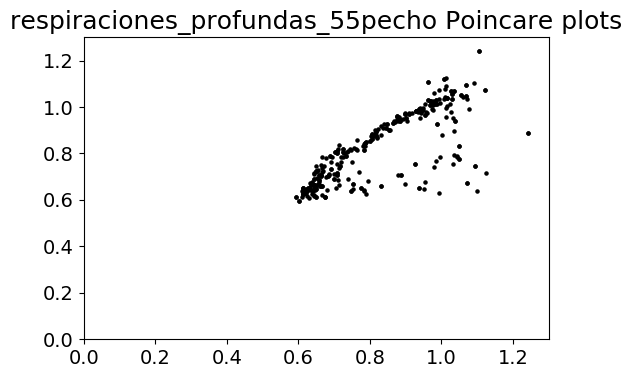

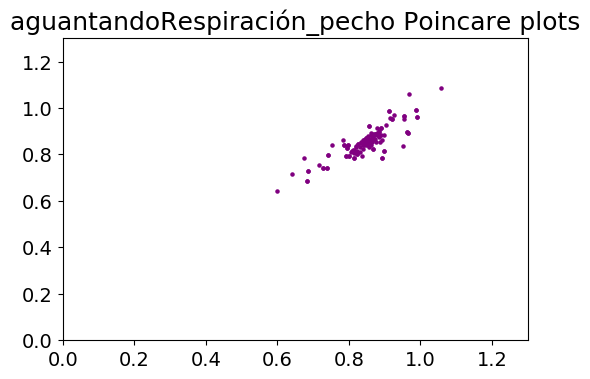

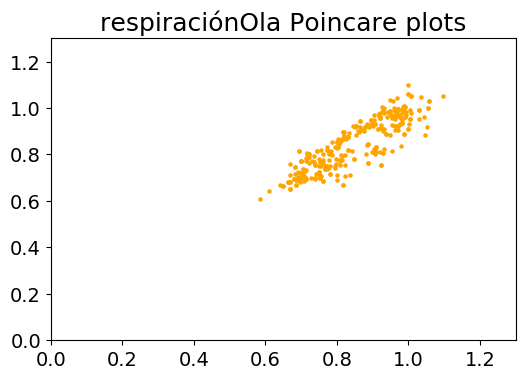

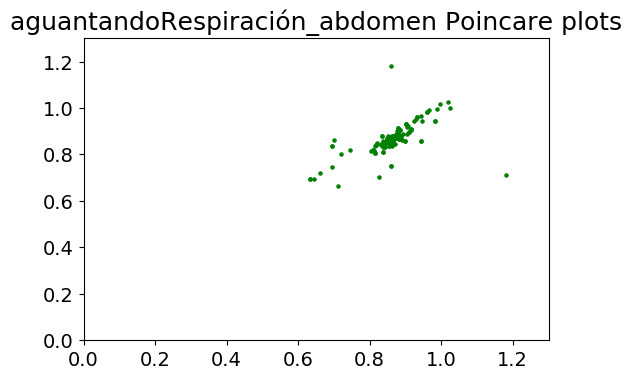

In [18]:
colors = ['blue', 'red', 'black', 'purple', "orange", "green"]
color_index = 0

for i in range(len(recordings)):

    if i!= 0 and corresponding_folder[i] != corresponding_folder[i-1]:
        color_index = color_index+1
        plt.title(str(corresponding_folder[i-1]) + " Poincare plots")
        plt.xlim(0,1.3)
        plt.ylim(0,1.3)
        plt.show()
        
        plt.scatter(recordings[i].xx[1:-1], recordings[i].xx[:-2],
                s = 5, c = colors[color_index])
    
    plt.scatter(recordings[i].xx[1:-1], recordings[i].xx[:-2],
                s = 5, c = colors[color_index])
    
plt.title(str(corresponding_folder[i-1]) + " Poincare plots")
plt.xlim(0,1.3)
plt.ylim(0,1.3)
plt.show()

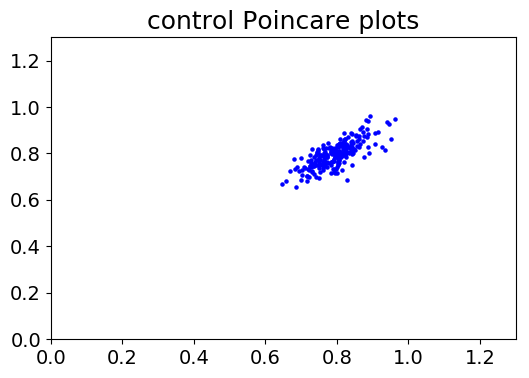

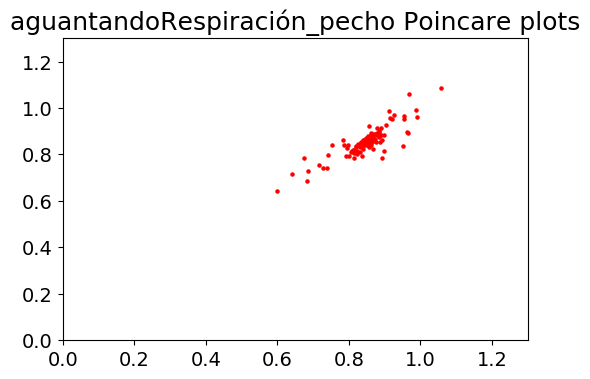

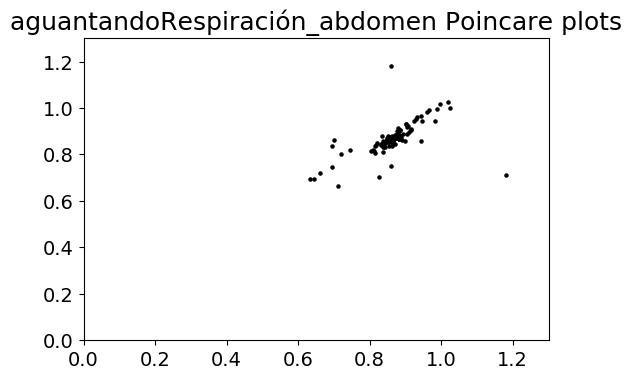

In [24]:
# Comparison between control, holding breath in chest and holding breath in abdomen
colors = ['blue', 'red', 'black', 'purple', "orange", "green"]
color_index = 0
banner = False

for i in range(len(recordings)):
    if banner == True and corresponding_folder[i] != corresponding_folder[i-1]:
        color_index = color_index+1
        plt.title(str(corresponding_folder[i-1]) + " Poincare plots")
        plt.xlim(0,1.3)
        plt.ylim(0,1.3)
        plt.show()
        banner = False

    if corresponding_folder[i]=="control":
        banner = True
        plt.scatter(recordings[i].xx[1:-1], recordings[i].xx[:-2],
                s = 5, c = colors[color_index], label = corresponding_folder[i])
    
    if "aguantando" in corresponding_folder[i]:
        banner = True
        plt.scatter(recordings[i].xx[1:-1], recordings[i].xx[:-2],
                s = 5, c = colors[color_index], label = corresponding_folder[i])
    
plt.title(str(corresponding_folder[i-1]) + " Poincare plots")
plt.xlim(0,1.3)
plt.ylim(0,1.3)
plt.show()

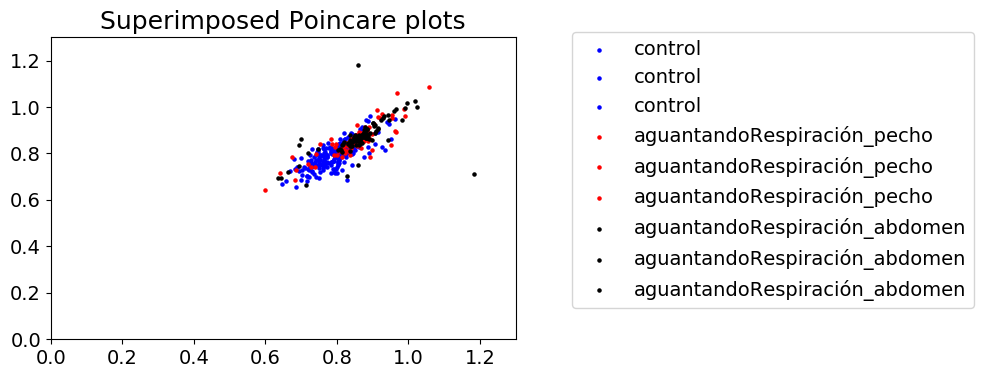

In [45]:
colors = ['blue', 'red', 'black', 'purple', "orange", "green"]
color_index = 0
banner = False

for i in range(len(recordings)):
    if banner == True and corresponding_folder[i] != corresponding_folder[i-1]:
        color_index = color_index+1
        banner = False

    if corresponding_folder[i]=="control" or "aguantando" in corresponding_folder[i]:
        banner = True
        plt.scatter(recordings[i].xx[1:-1], recordings[i].xx[:-2],
                s = 5, c = colors[color_index], label = corresponding_folder[i])
        
plt.title("Superimposed Poincare plots")
plt.xlim(0,1.3)
plt.ylim(0,1.3)
plt.legend(bbox_to_anchor=(1.1, 1.05))
plt.show()

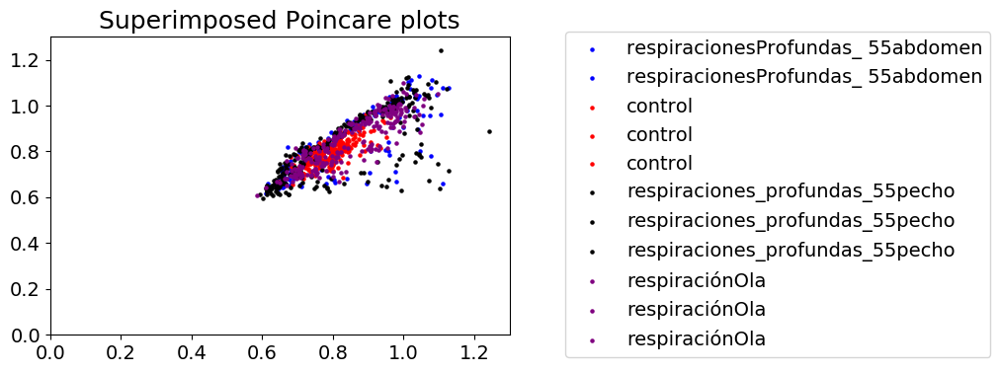

In [44]:
# Comparar: control, respiraciones profundas 55 pecho, respiraciones profundas 55 abdomen, respiraciones en ola.

colors = ['blue', 'red', 'black', 'purple', "orange", "green"]
color_index = 0
banner = False

for i in range(len(recordings)):
    if banner == True and corresponding_folder[i] != corresponding_folder[i-1]:
        color_index = color_index+1
        banner = False

    if corresponding_folder[i]=="control" or "55" in corresponding_folder[i] or "Ola" in corresponding_folder[i]:
        banner = True
        plt.scatter(recordings[i].xx[1:-1], recordings[i].xx[:-2],
                s = 5, c = colors[color_index], label = corresponding_folder[i])
        
plt.title("Superimposed Poincare plots")
plt.xlim(0,1.3)
plt.ylim(0,1.3)
plt.legend(bbox_to_anchor=(1.1, 1.05))
plt.show()

Notice how Techniques respiraciones profundas 55 pecho, respiraciones profundas 55 abdomen, respiraciones en ola make the R R intervals change. Very interesting what happens to the heartbeat while meditating!

Interpretación: Al someter al cuerpo bajo un esfuerzo físico como aguantar la resipración, los intervalos R-R Se vuelven más regulares y el corazón comienza a asemejarse a un reloj. Tanto sus intervalos entre latidos se vuelven más regulares y aumenta la frecuencia de los picos R.

# Phase space reconstruction

In the previos technique we only compared the R intervals with the next interval. What would happen if we compare not the R interval, but the whole recording with a certain time delay we choose. Instead of comparing one data point with its next in time, we choose an arbitrary time delay? In other words, we are going to generalize what we applied in the previous technique with the whole ECG data series and with an arbitrary time delay.

In [46]:
#Generating a function that will reconstruct the phase space for a certain time delay
# data_series is the voltage of our signal
# period is the time delay
# identifier is a string that will help us identify that particular graph

def graph_phase_space(waveData, period = 210, identifier = "xx"):
    time = period*0.1 #time is in miliseconds
    n = np.size(waveData) #size of the voltage vector
    
    plt.figure(2)
    plt. plot(waveData[0: n-period], waveData[period: n],
              marker = "o", markersize = 0.05, linewidth = 0.005, color = "black")
    plt.title(identifier+r": $t+"+str(time)+"ms$")
    plt.xlabel(r"$x_n$")
    y = r'$x_{n+'+str(time)+"ms}$"
    plt.ylabel(y)
    plt.xlim(-10000, 14000)
    plt.ylim(-9000, 16000)
    plt.show()
    return None

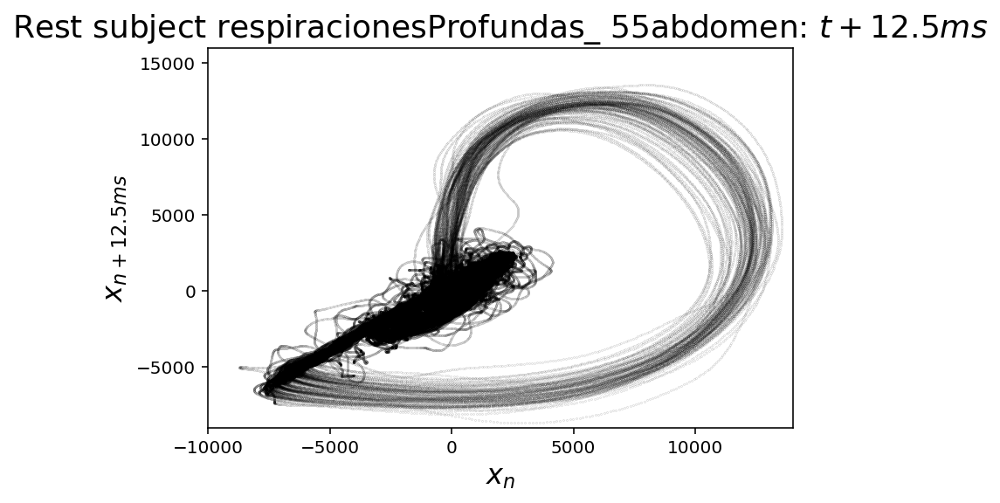

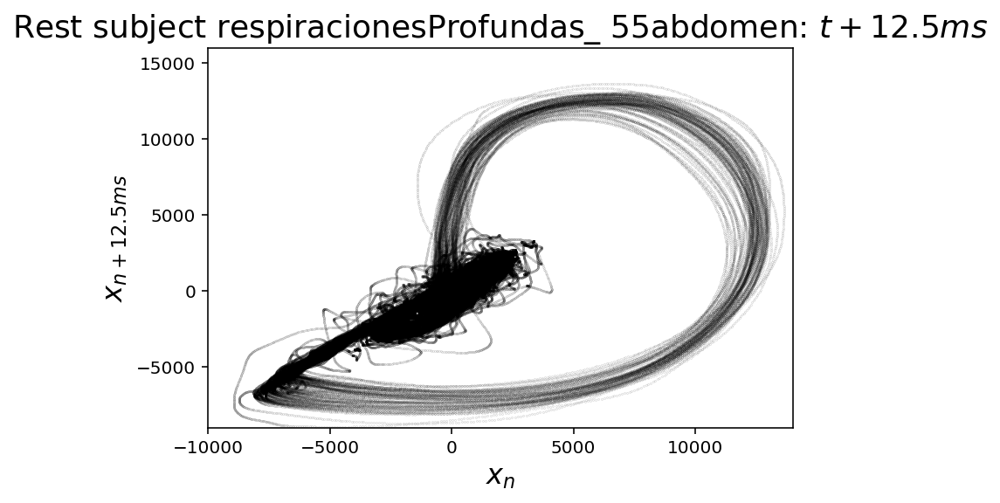

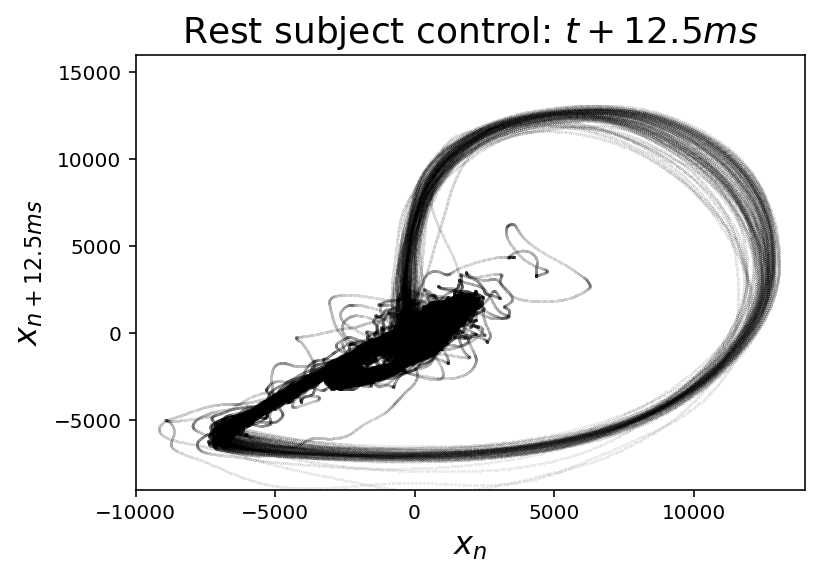

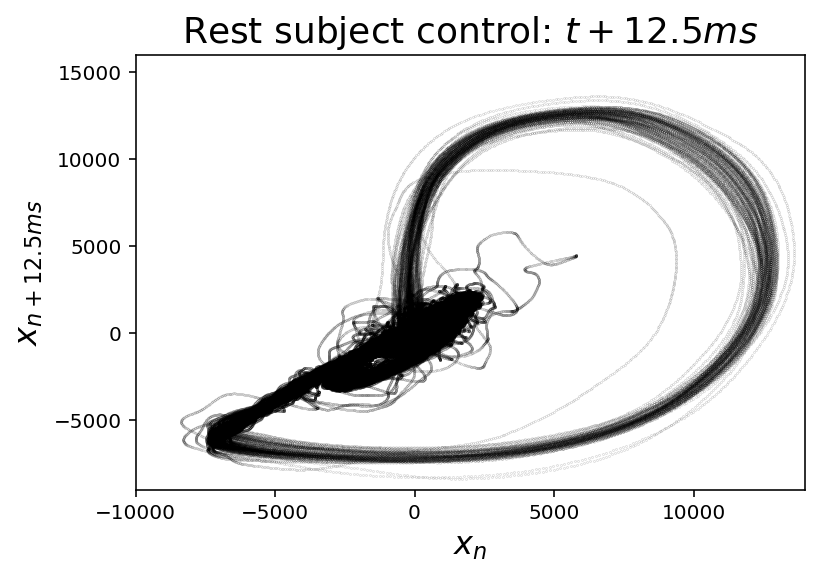

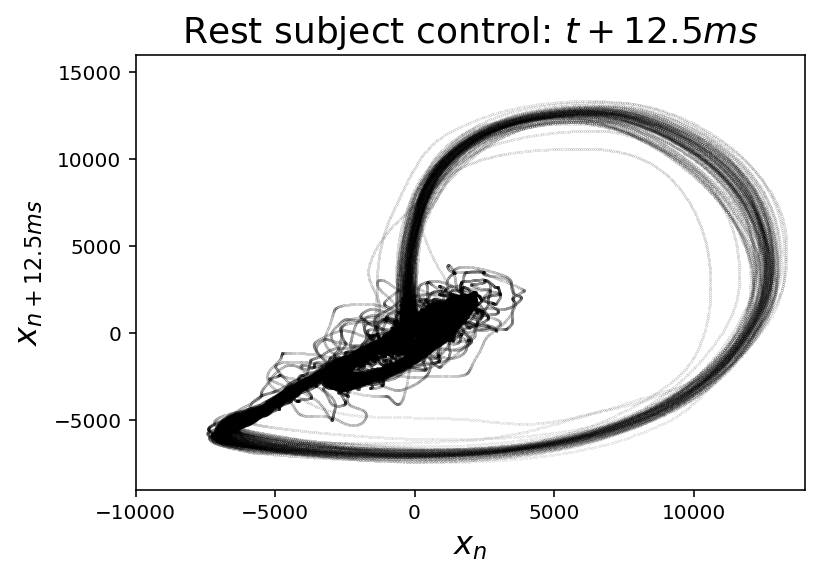

...

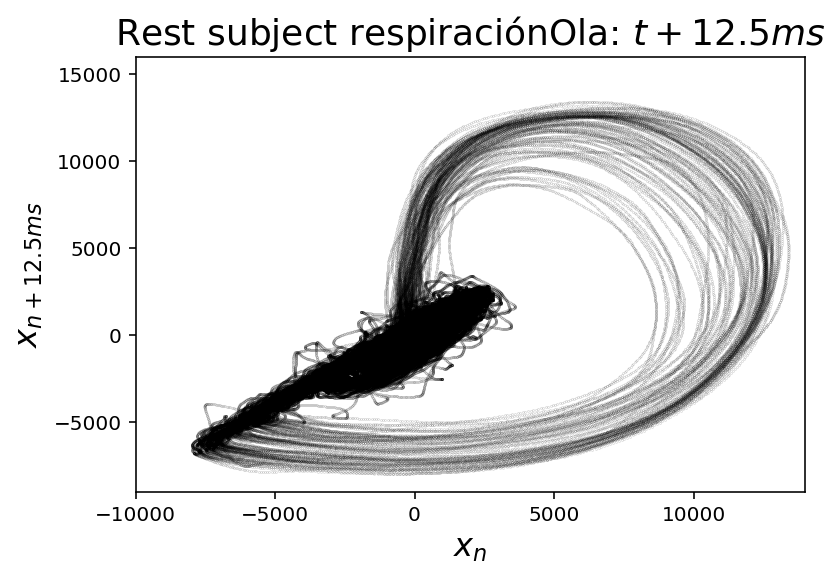

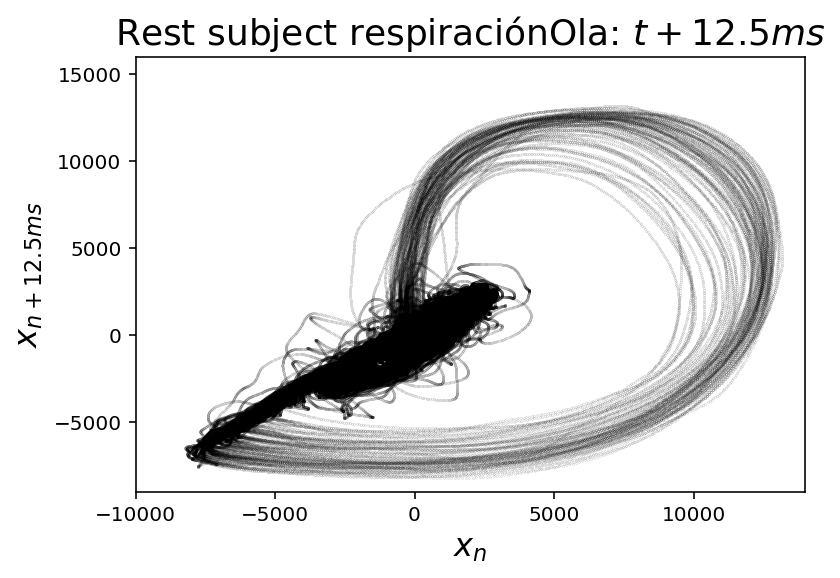

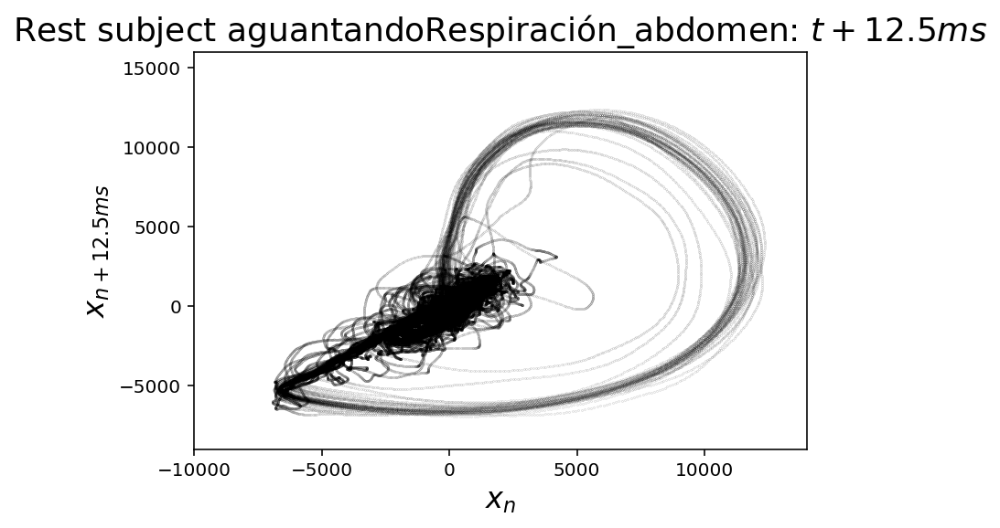

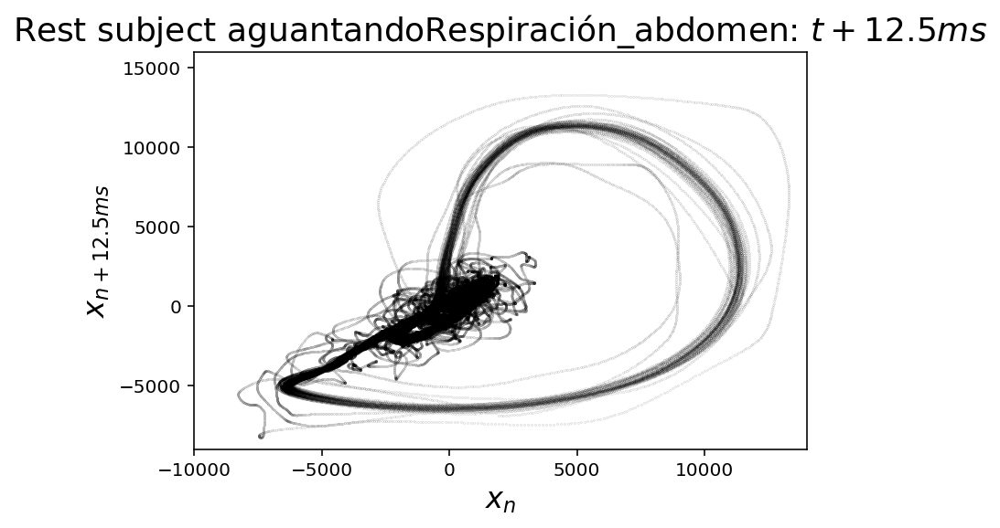

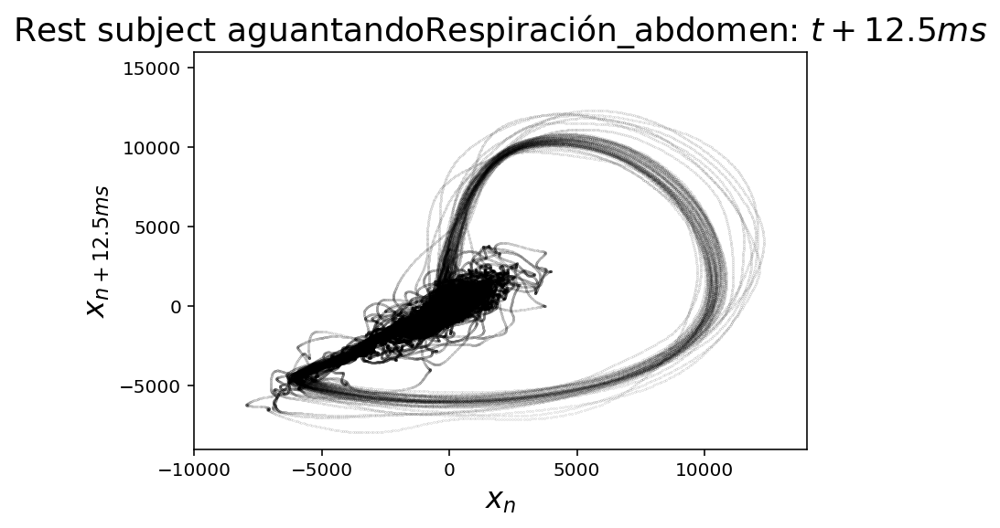

In [43]:
time_delay = 125 #12.5 ms

for i in range(len(recordings)):
    identifier = "Rest subject " + corresponding_folder[i]
    graph_phase_space(recordings[i].waveData, time_delay, identifier)

Notice how the trajectory in phase space becomes smaller when the subject is holdings his breath.

Aqui podrías volver a superponer los registros de aguantar la respiración y los otros. Con los mismos colores que usaste en Poincaré a ver si se observa algún patrón.

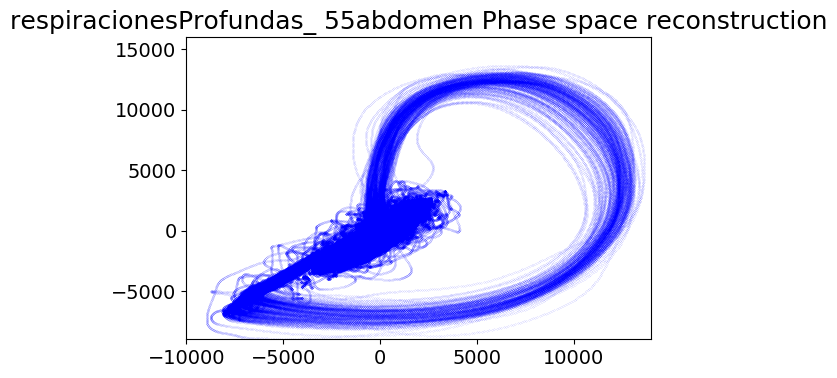

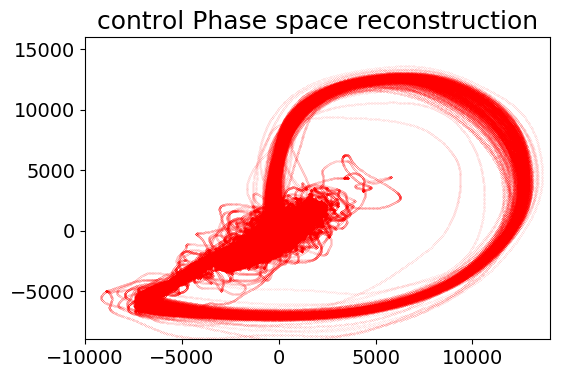

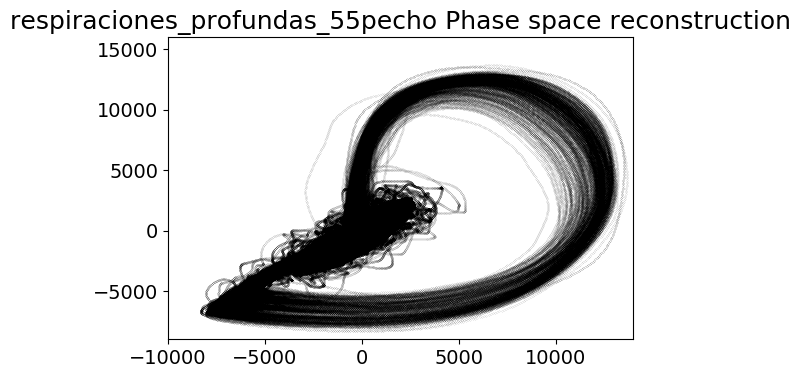

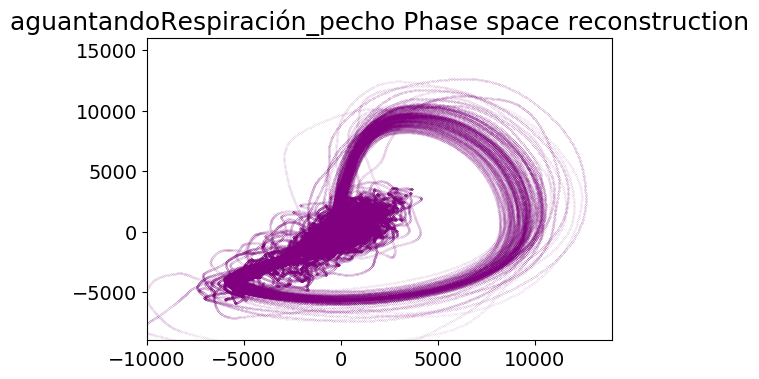

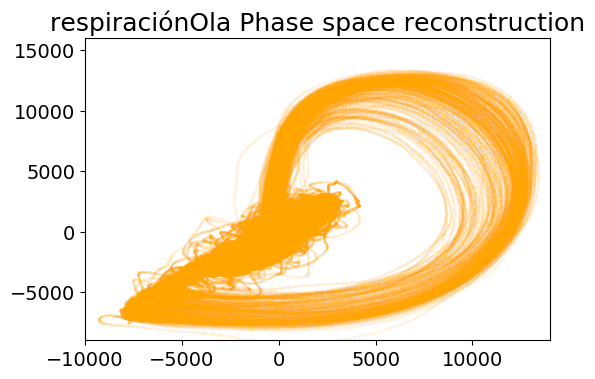

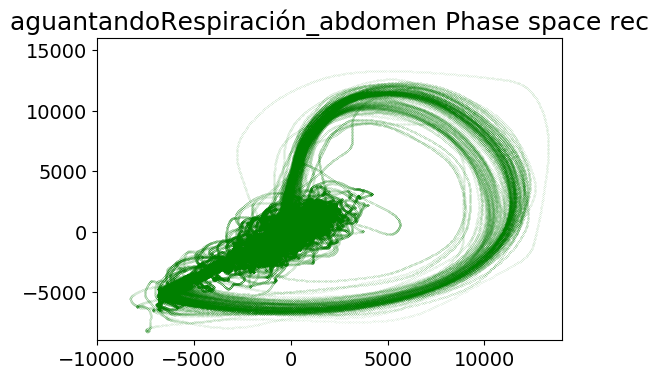

In [56]:
colors = ['blue', 'red', 'black', 'purple', "orange", "green"]
color_index = 0
time_delay = 125 #12.5 ms

for i in range(len(recordings)):
    n = np.size(recordings[i].waveData) #size of the voltage vector
    
    if i!= 0 and corresponding_folder[i] != corresponding_folder[i-1]:
        color_index = color_index+1
        plt.title(str(corresponding_folder[i-1]) + " Phase space reconstruction")
        plt.xlim(-10000, 14000)
        plt.ylim(-9000, 16000)
        plt.show()
        
        plt. plot(recordings[i].waveData[0: n-time_delay], recordings[i].waveData[time_delay: n],
              marker = "o", markersize = 0.05, linewidth = 0.005, c= colors[color_index])
        
    plt. plot(recordings[i].waveData[0: n-time_delay], recordings[i].waveData[time_delay: n],
              marker = "o", markersize = 0.05, linewidth = 0.005, c= colors[color_index])
    
plt.title(str(corresponding_folder[i-1]) + " Phase space rec")
plt.xlim(-10000, 14000)
plt.ylim(-9000, 16000)
plt.show()

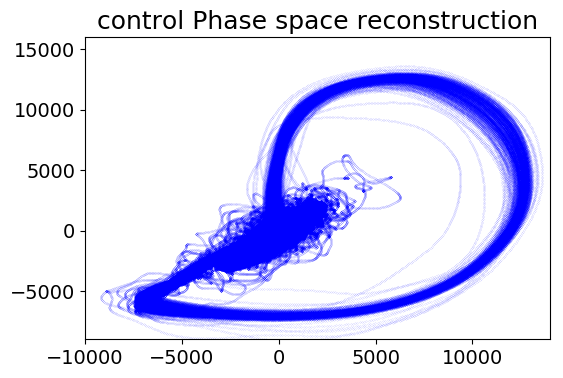

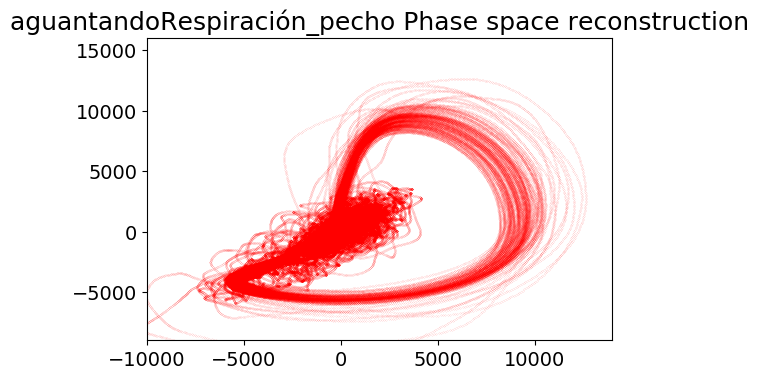

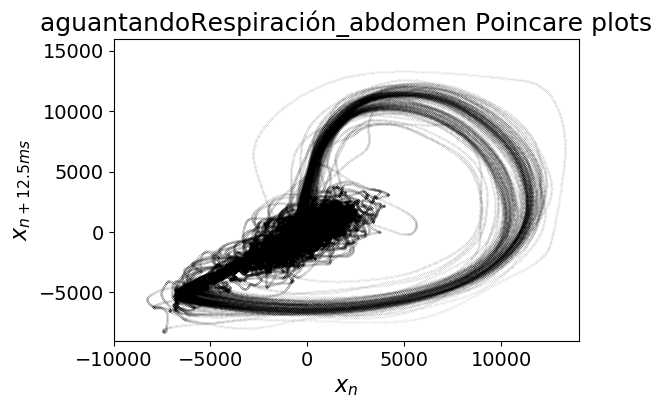

In [55]:
# Comparison between control, holding breath in chest and holding breath in abdomen
colors = ['blue', 'red', 'black', 'purple', "orange", "green"]
color_index = 0
banner = False
time_delay = 125 #12.5 ms

for i in range(len(recordings)):
    if banner == True and corresponding_folder[i] != corresponding_folder[i-1]:
        color_index = color_index+1
        plt.title(str(corresponding_folder[i-1]) + " Phase space reconstruction")
        plt.xlim(-10000, 14000)
        plt.ylim(-9000, 16000)
        plt.show()
        banner = False
        
    if corresponding_folder[i]=="control" or "aguantando" in corresponding_folder[i]:
        banner = True
        n = np.size(recordings[i].waveData) #size of the voltage vector
        plt. plot(recordings[i].waveData[0: n-time_delay], recordings[i].waveData[time_delay: n],
              marker = "o", markersize = 0.05, linewidth = 0.005, c= colors[color_index],
              label = corresponding_folder[i])
        
plt.title(str(corresponding_folder[i-1]) + " Poincare plots")
plt.xlabel(r"$x_n$")
y = r'$x_{n+'+str(time_delay*0.1)+"ms}$"
plt.ylabel(y)
plt.xlim(-10000, 14000)
plt.ylim(-9000, 16000)
plt.show()

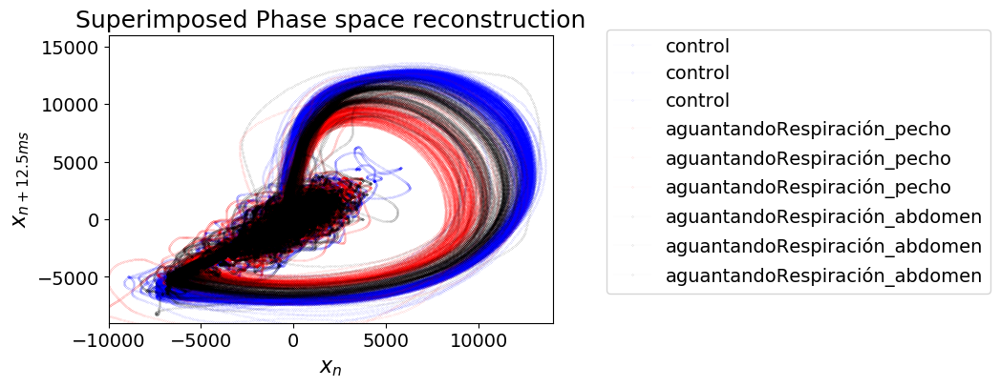

In [50]:
colors = ['blue', 'red', 'black', 'purple', "orange", "green"]
color_index = 0
banner = False
time_delay = 125 #12.5 ms

for i in range(len(recordings)):
    if banner == True and corresponding_folder[i] != corresponding_folder[i-1]:
        color_index = color_index+1
        banner = False

    if corresponding_folder[i]=="control" or "aguantando" in corresponding_folder[i]:
        banner = True
        n = np.size(recordings[i].waveData) #size of the voltage vector
        plt. plot(recordings[i].waveData[0: n-time_delay], recordings[i].waveData[time_delay: n],
              marker = "o", markersize = 0.05, linewidth = 0.005, c= colors[color_index],
                  label = corresponding_folder[i])
        
plt.title("Superimposed Phase space reconstruction")
plt.xlabel(r"$x_n$")
y = r'$x_{n+'+str(time_delay*0.1)+"ms}$"
plt.ylabel(y)
plt.xlim(-10000, 14000)
plt.ylim(-9000, 16000)
plt.legend(bbox_to_anchor=(1.1, 1.05))
plt.show()

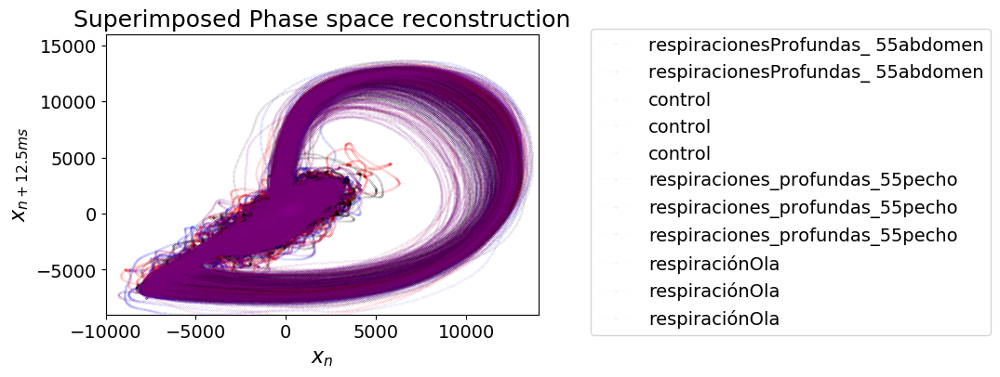

In [51]:
# Comparar: control, respiraciones profundas 55 pecho, respiraciones profundas 55 abdomen, respiraciones en ola.

colors = ['blue', 'red', 'black', 'purple', "orange", "green"]
color_index = 0
banner = False
time_delay = 125 #12.5 ms

for i in range(len(recordings)):
    if banner == True and corresponding_folder[i] != corresponding_folder[i-1]:
        color_index = color_index+1
        banner = False

    if corresponding_folder[i]=="control" or "55" in corresponding_folder[i] or "Ola" in corresponding_folder[i]:
        banner = True
        n = np.size(recordings[i].waveData) #size of the voltage vector
        plt. plot(recordings[i].waveData[0: n-time_delay], recordings[i].waveData[time_delay: n],
              marker = "o", markersize = 0.05, linewidth = 0.005, c= colors[color_index],
                  label = corresponding_folder[i])
        
plt.title("Superimposed Phase space reconstruction")
plt.xlabel(r"$x_n$")
y = r'$x_{n+'+str(time_delay*0.1)+"ms}$"
plt.ylabel(y)
plt.xlim(-10000, 14000)
plt.ylim(-9000, 16000)
plt.legend(bbox_to_anchor=(1.1, 1.05))
plt.show()

### Exercise: Are the results obtained in a Poincaré plot and in a recurrence plot contradictory? While we are observing a loss in the first plot's variability with exercise, we are seeing the opposite in a recurrence plot. Why?

# Recurrence plots

This is a technique which compares every single data point to every other. Because of this reason, it is a very expensive algorithm computationaly. To reduce this computational time, we must create a surrogate data set. Be sure to create a surrogate data set that includes at least two QRS complexes.

In the following cell, change the start and end values to obtain two QRS complexes.

In [18]:
# Function for creating the surrogate time series
def surrogate(timeECG, waveData, start, end):
    surrogate = [waveData[start+i*5] for i in range(0, int((end-start)/5))]
    time_surrogate = [timeECG[start+i*5] for i in range(0, int((end-start)/5))]
    
    print("Sampling rate of ", len(waveData)/timeECG[-1],
          " points per second got reduced to ", len(time_surrogate)/time_surrogate[-1],
         " points per second.")
    
    print("Time series of ",len(timeECG[start:end])," got reduced to ",len(time_surrogate))
    
    return [time_surrogate, surrogate]

# Heat map Recurrence plot
def recurrence_plot(surrogate, data_point_delay = 25):
    n = len(surrogate)
    euclid = np.zeros((n,n), dtype = 'float')
    normal_euclid = np.zeros((n,n), dtype = 'float')

    #Cycle for obtaining the euclid distance between any two points
    for i in range(0, n-data_point_delay):
        for j in range(data_point_delay, n):
            euclid[i][j] = np.sqrt(np.abs(surrogate[i]**2 - surrogate[j]**2)) #euclidian norm

    normal_aux = np.max(euclid)

    # Cycle for normalizing the distance
    for i in range(0, n-data_point_delay):
        for j in range(data_point_delay, n):
            normal_euclid[i][j] = np.abs(euclid[i][j]/normal_aux-1)
            #Normalizing the values, and the farthest points have the lowest value (0),
            #while the nearest points have a value near 1

    return normal_euclid

def graph_recurrence(surrogate_data, index_surrogate, normal_euclid):
    
    #Initializing the graphic space
    fig = plt.figure(figsize=(6,8))
    gs = mpl.gridspec.GridSpec(2, 2, height_ratios=[1, 1], width_ratios=[2, 1])
    ax1 = fig.add_subplot(gs[1, 0])
    ax2 = fig.add_subplot(gs[0, 0], sharex=ax1)
    plt.tick_params(which='both', top=False, right=False)
    ax2.set_autoscalex_on(False)

    # Electrocardiogram
    ax1.set_title("Electrocardiogram")
    ax1.set_ylabel('Voltage')
    ax1.set_xlabel('Index')
    ax1.set_xlim(0, len(surrogate_data))
    ax1.plot(index_surrogate, surrogate_data, marker="o", c="k") #index_surrogate or time_surrogate (ms)

    # Recurrence plot
    ax2.set_title("Recurrence plot")
    plot = ax2.imshow(normal_euclid, origin='lower', aspect="auto", cmap="jet")
    axins = inset_axes(ax2,
                   width="5%", # width = 10% of parent_bbox width
                   height="100%", # height : 50%
                   loc=6,
                   bbox_to_anchor=(1.05, 0., 1, 1),
                   bbox_transform=ax2.transAxes,
                   borderpad=0,)

    cbar = plt.colorbar(plot, cax=axins)
    plt.show()
    return None

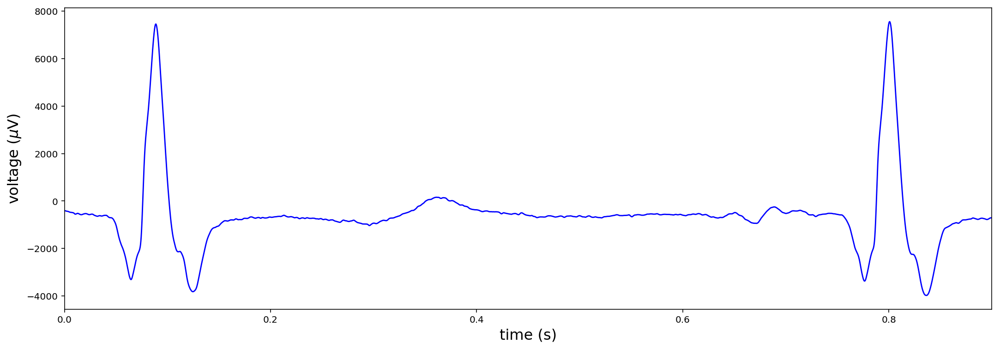

Sampling rate of  10000.0  points per second got reduced to  2001.1085422545434  points per second.
Time series of  9000  got reduced to  1800


In [19]:
# This cell must be repeated for every recording
start = 0
end = 9000

plt.figure(figsize=(18,6))
plt.xlabel(r'time (s)')
plt.ylabel(r'voltage ($\mu$V)')
plt.xlim(subjects[0].timeECG_rest[start], subjects[0].timeECG_rest[end])

plt.plot(subjects[0].timeECG_rest[start:end], subjects[0].waveData_rest[start:end], 'b')
plt.show()

time_surrogate_rest1, surrogate_rest1 = surrogate(subjects[0].timeECG_rest,
                                                  subjects[0].waveData_rest,
                                                  start, end)

In [33]:
time_exer_surrogates = [time_surrogate_exer1, time_surrogate_exer2,
                        time_surrogate_exer3, time_surrogate_exer4,
                        time_surrogate_exer5, time_surrogate_exer6,
                        time_surrogate_exer7]
waveData_exer_surrogates = [surrogate_exer1, surrogate_exer2, surrogate_exer3,
                            surrogate_exer4, surrogate_exer5, surrogate_exer6,
                            surrogate_exer7]

time_rest_surrogates = [time_surrogate_rest1, time_surrogate_rest2,
                        time_surrogate_rest3, time_surrogate_rest4,
                        time_surrogate_rest5, time_surrogate_rest6,
                        time_surrogate_rest7]
waveData_rest_surrogates = [surrogate_rest1, surrogate_rest2, surrogate_rest3,
                            surrogate_rest4, surrogate_rest5, surrogate_rest6,
                            surrogate_rest7]

Now we will reconstruct the attractor just like in the previous exercise, but only with this surrogate tiem series. First, we choose a delay just like in the previous exercise, for example $delay=12.5 ms$. We must find the number of data poitns that correspond to this time delay.

In [34]:
data_point_delay = 25
for i in range(0, 7):
    print("Subject "+str(i+1))
    delay_rest = time_rest_surrogates[i][data_point_delay]-time_rest_surrogates[i][0]
    print("Rest "+str(delay_rest))
    delay_exer = time_exer_surrogates[i][data_point_delay]-time_exer_surrogates[i][0]
    print("After exercise "+str(delay_exer))

Subject 1
Rest 0.012500019904490293
After exercise 0.012500020645664245
Subject 2
Rest 0.012500019970667076
After exercise 0.012500019998303635
Subject 3
Rest 0.012500020642561616
After exercise 0.012500020126102105
Subject 4
Rest 0.012500020370382448
After exercise 0.012500018025916944
Subject 5
Rest 0.01250001979389026
After exercise 0.012500017630241667
Subject 6
Rest 0.012500020671783347
After exercise 0.012500011589483773
Subject 7
Rest 0.012500017884685244
After exercise 0.012500018544920999


Perfect! Now let's reconstruct the attractor.

Subject1


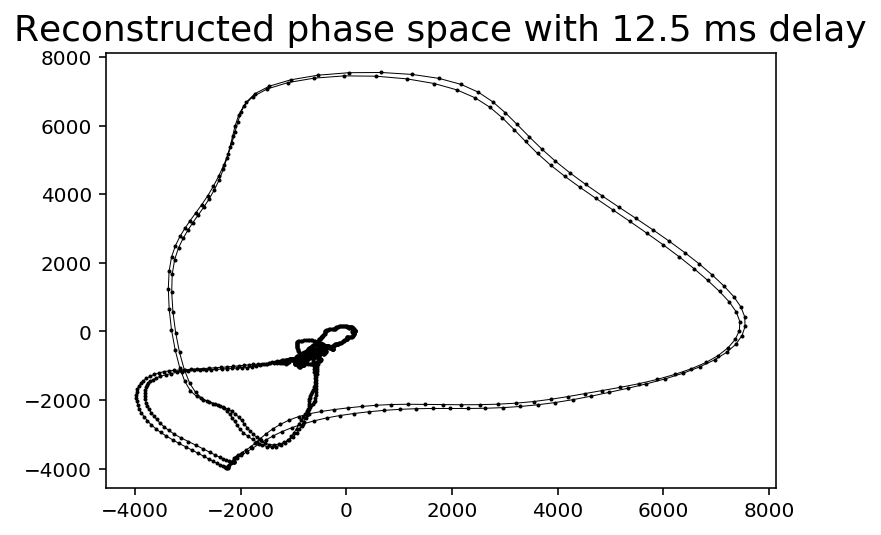

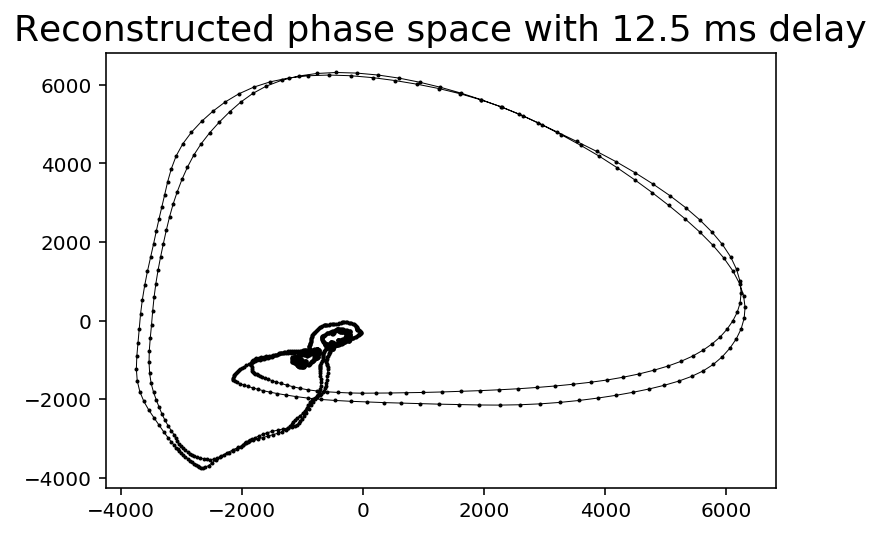

Subject2


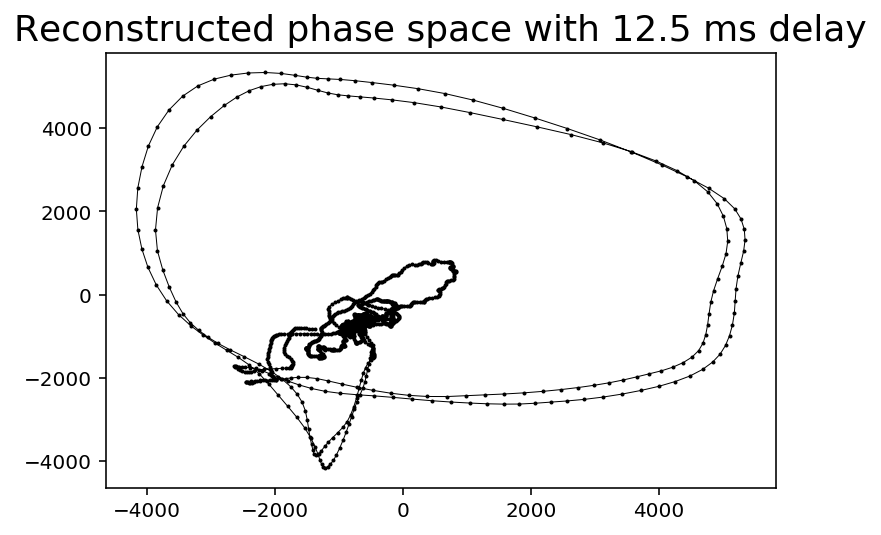

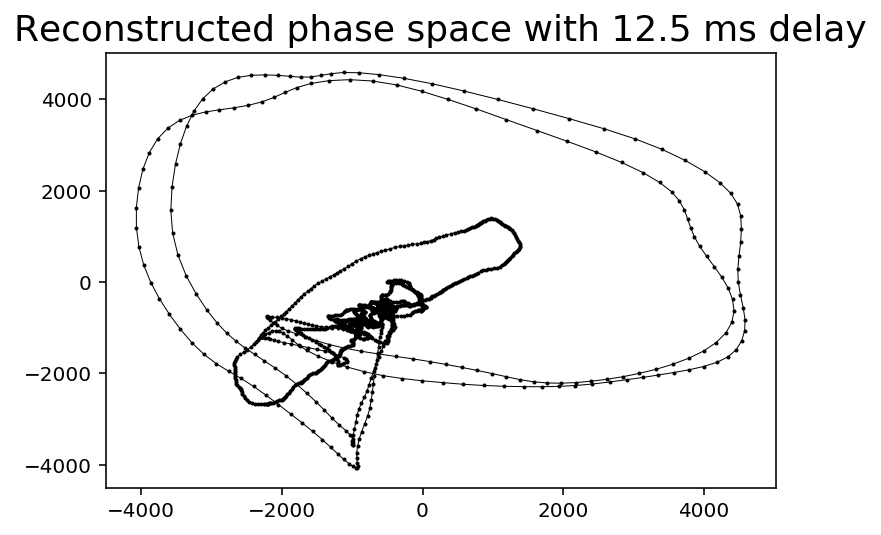

Subject3


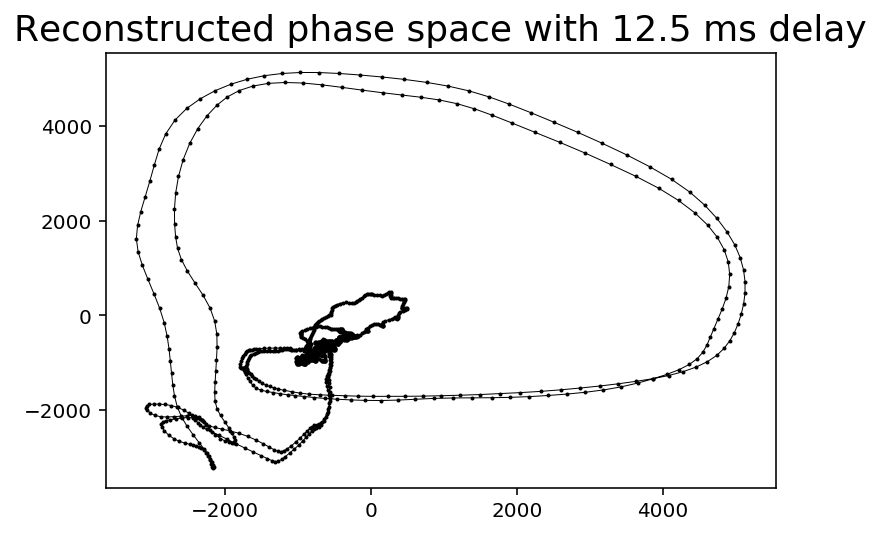

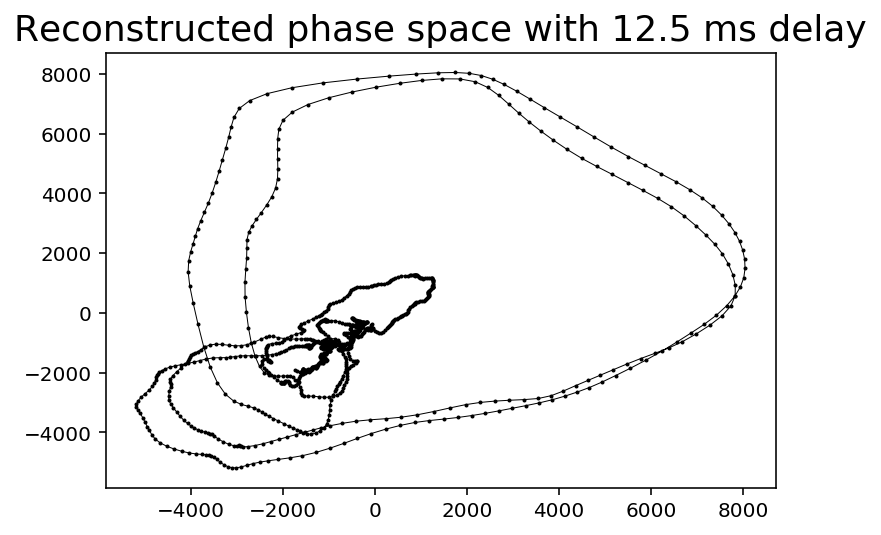

Subject4


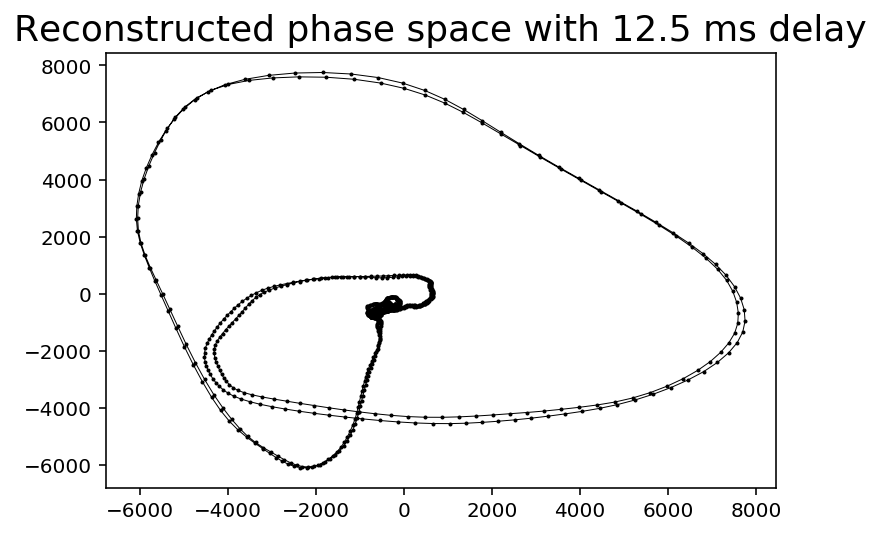

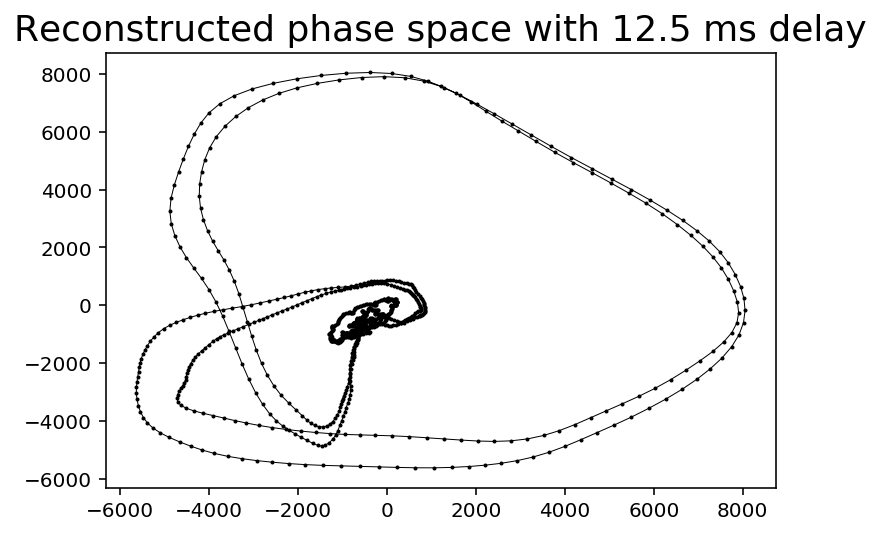

Subject5


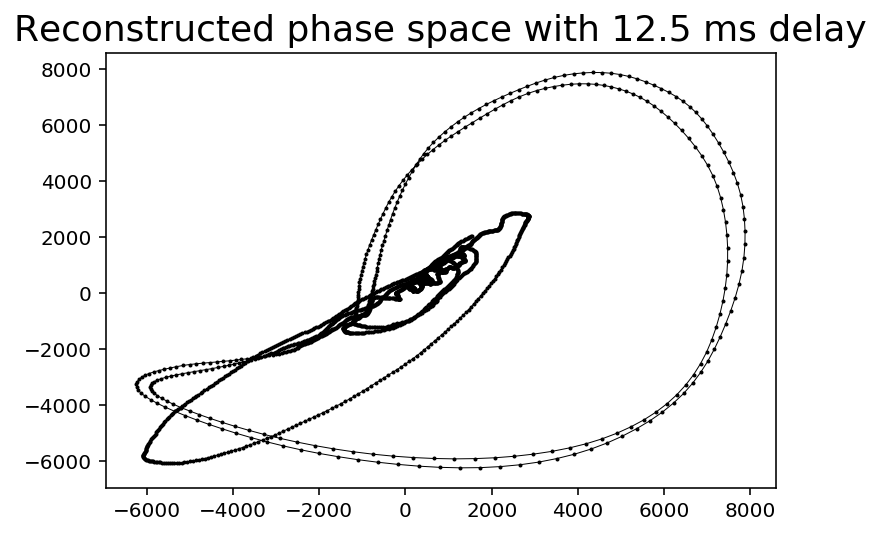

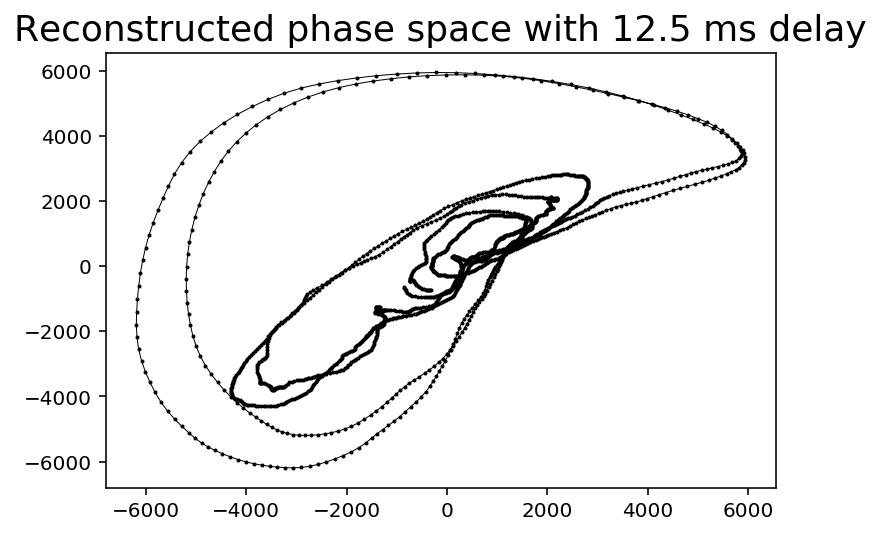

Subject6


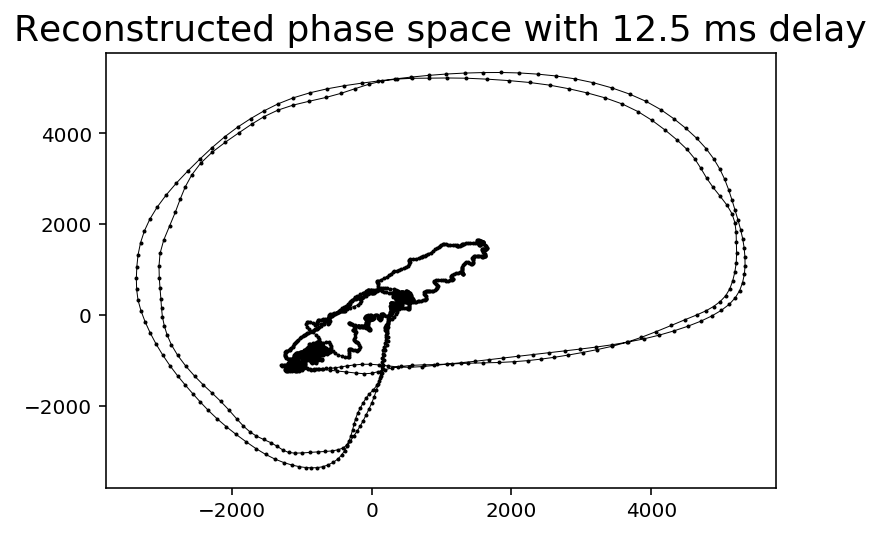

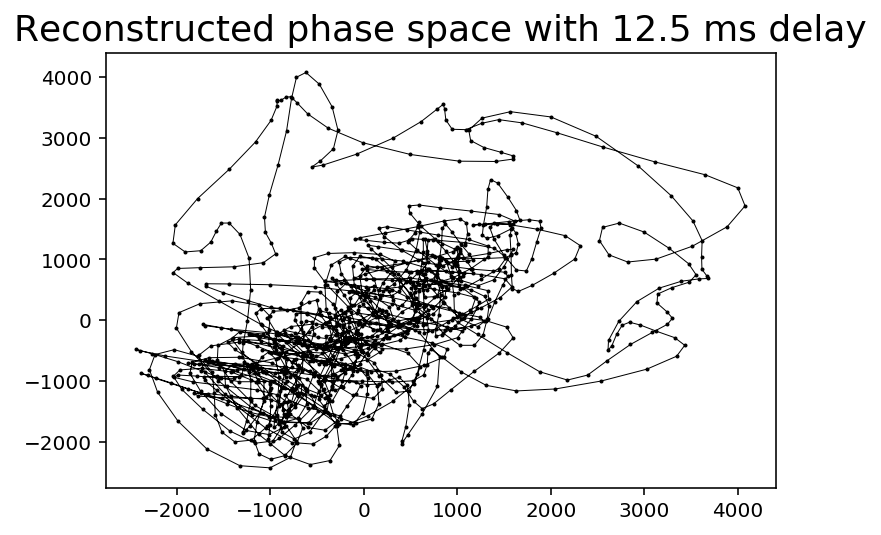

Subject7


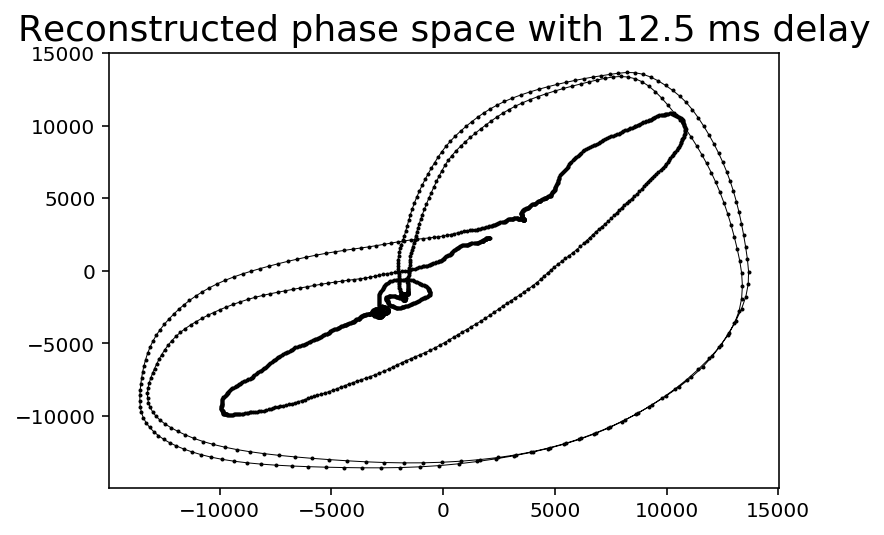

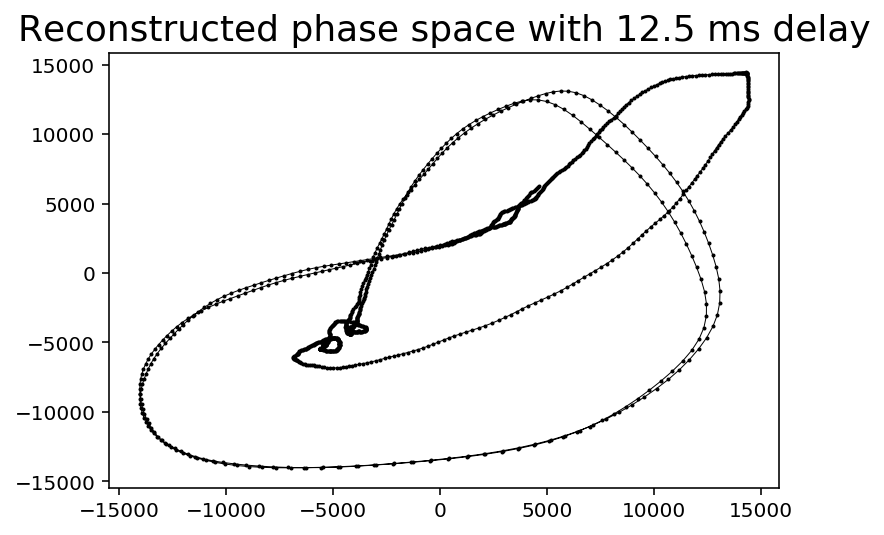

In [35]:
# Reconstructing the attractor
for i in range(0, 7):
    print("Subject"+str(i+1))
    n = np.size(waveData_rest_surrogates[i])
    plt.plot(waveData_rest_surrogates[i][0: n-data_point_delay],
             waveData_rest_surrogates[i][data_point_delay: n],
              marker = "o", markersize = 1, linewidth = 0.5, color = "black")
    plt.title("Reconstructed phase space with 12.5 ms delay")
    plt.show()
    
    n = np.size(waveData_exer_surrogates[i])
    plt.plot(waveData_exer_surrogates[i][0: n-data_point_delay],
             waveData_exer_surrogates[i][data_point_delay: n],
              marker = "o", markersize = 1, linewidth = 0.5, color = "black")
    plt.title("Reconstructed phase space with 12.5 ms delay")
    plt.show()

Now, we create the recurrence plot.

In [36]:
normal_euclid_rest = []
normal_euclid_exer = []

for i in range (0, 7):
    normal_euclid_rest.append(recurrence_plot(waveData_rest_surrogates[i], 25))
    normal_euclid_exer.append(recurrence_plot(waveData_exer_surrogates[i], 25)) 
    print("Finished subject "+str(i+1))

Finished subject 1
Finished subject 2
Finished subject 3
Finished subject 4
Finished subject 5
Finished subject 6
Finished subject 7


In [37]:
index_surrogate_rest = []
index_surrogate_exer = []

#Creating a vector with the indices for the surrogate data
for i in range(0, 7):
    index_surrogate_rest.append([i for i in range(0, len(waveData_rest_surrogates[i]))])
    index_surrogate_exer.append([i for i in range(0, len(waveData_exer_surrogates[i]))])

Subject 1


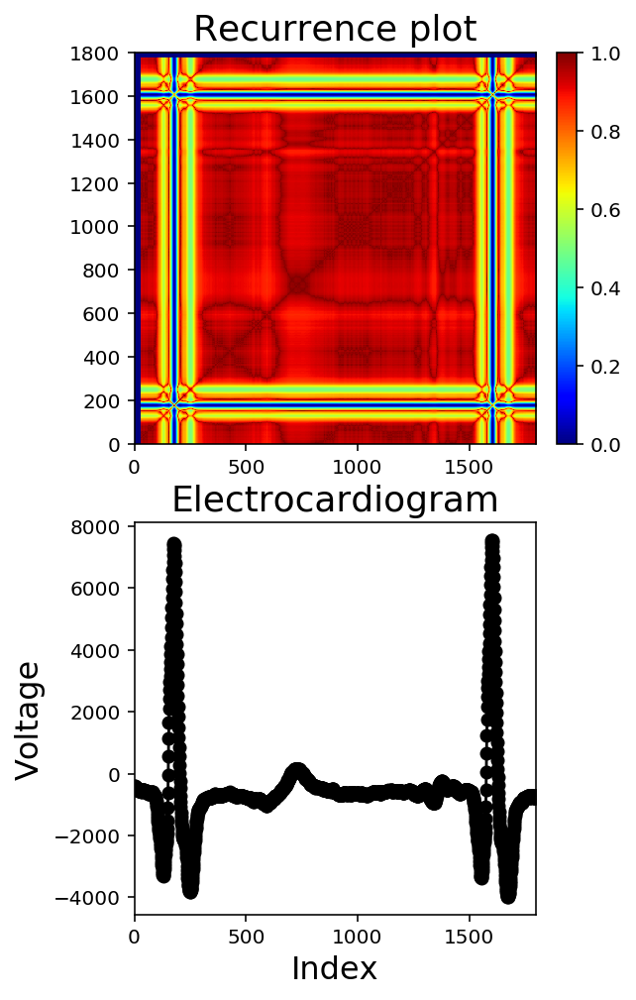

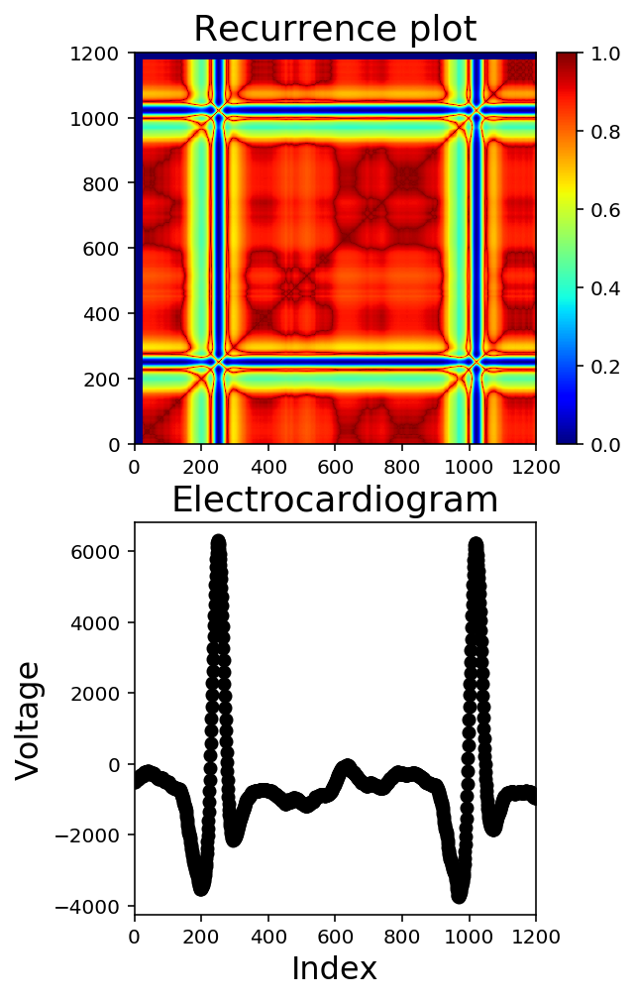

Subject 2


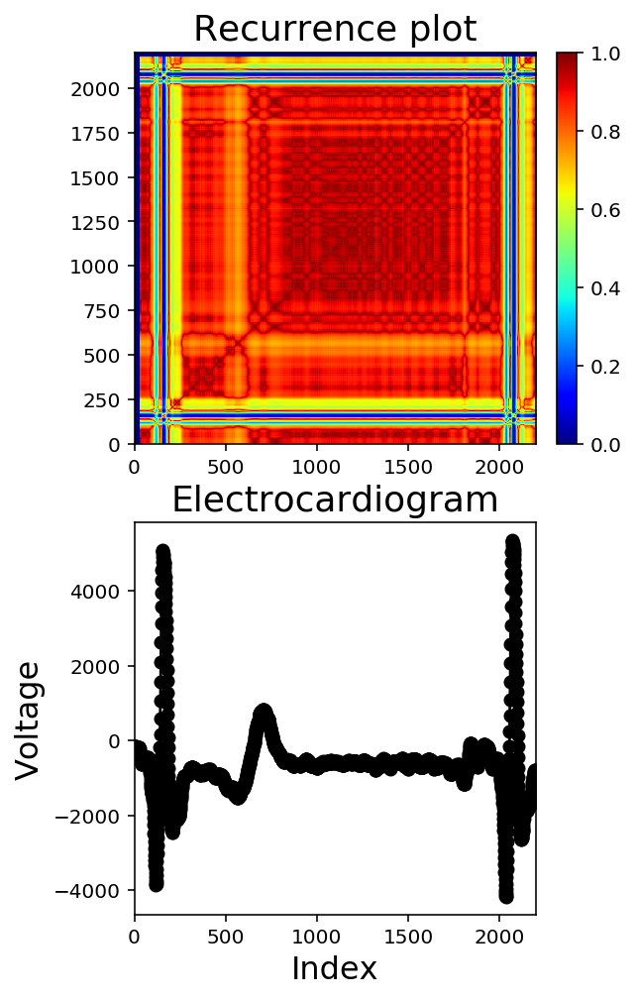

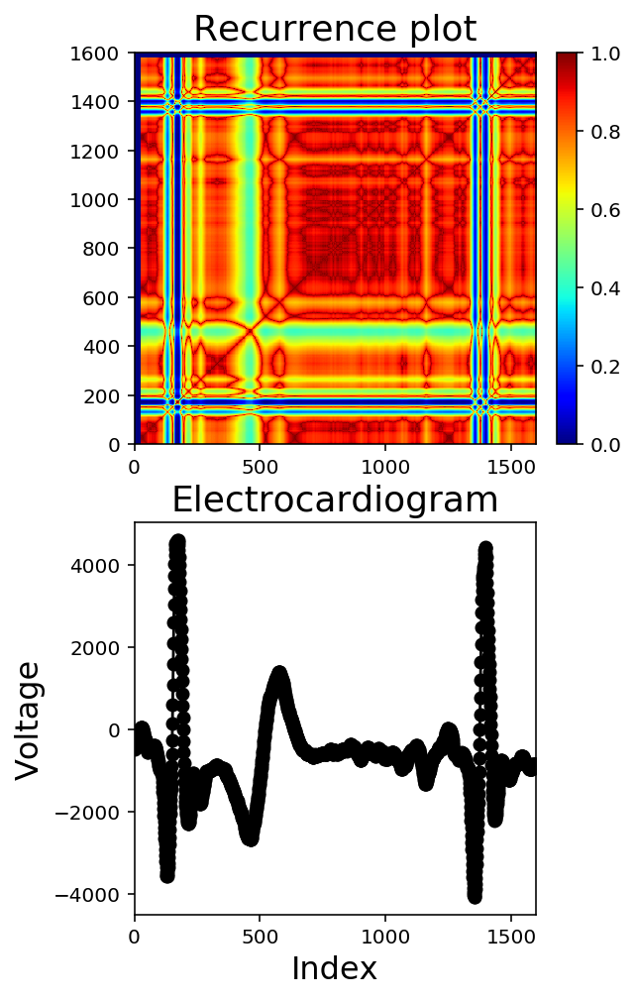

Subject 3


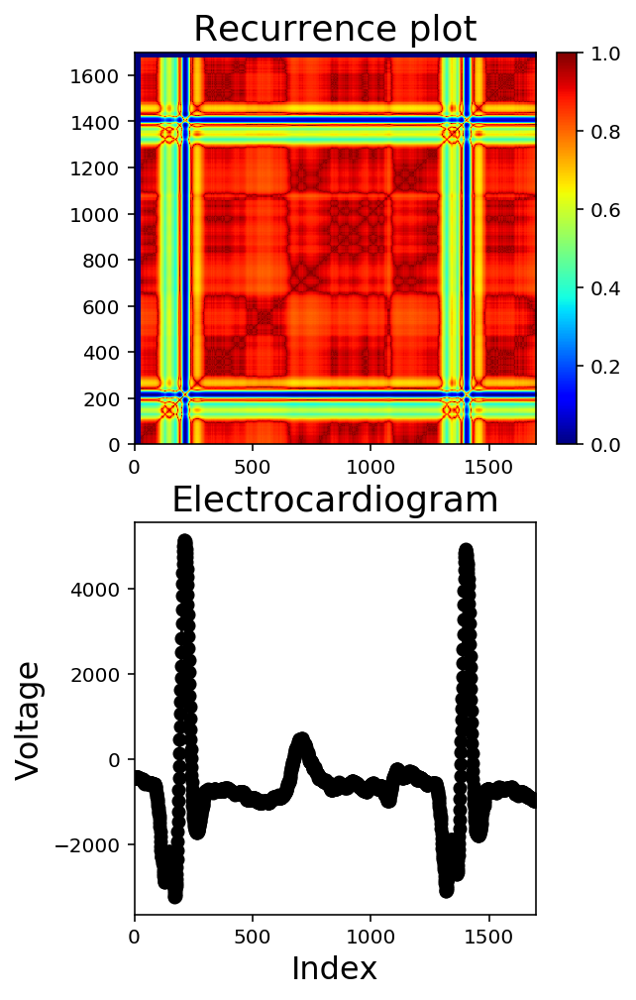

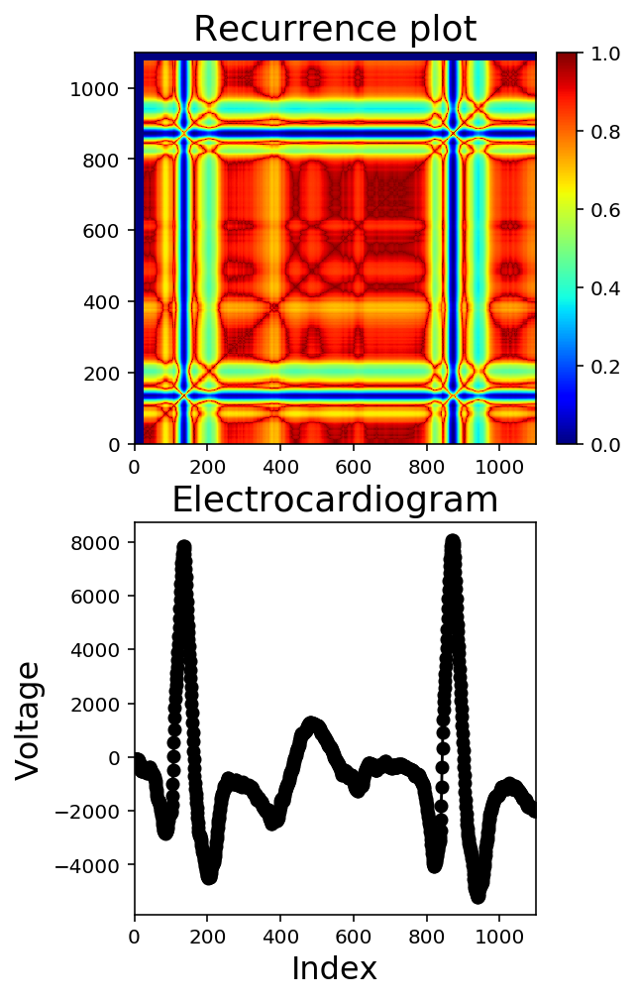

Subject 4


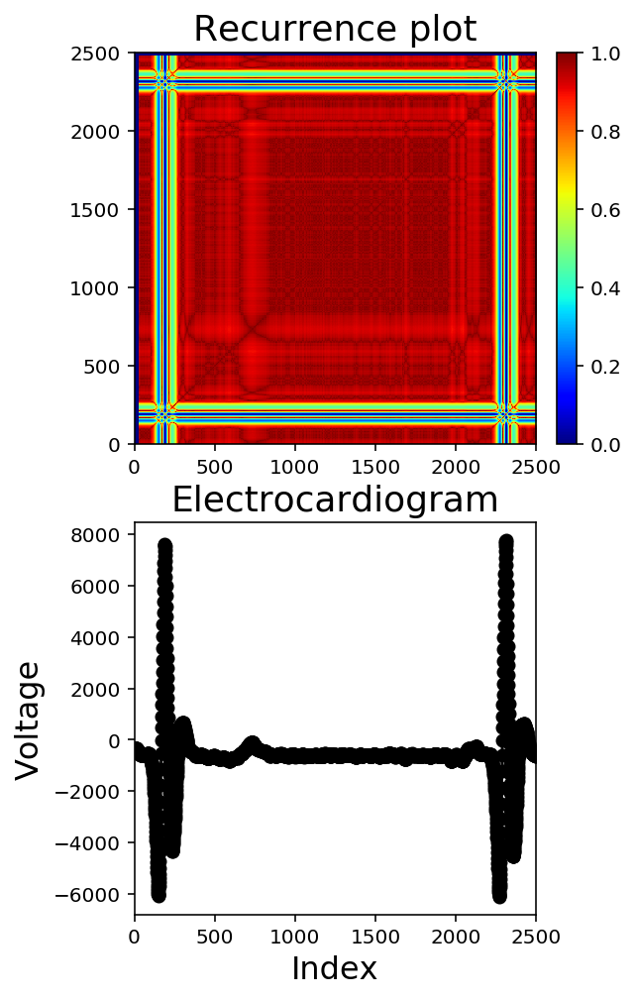

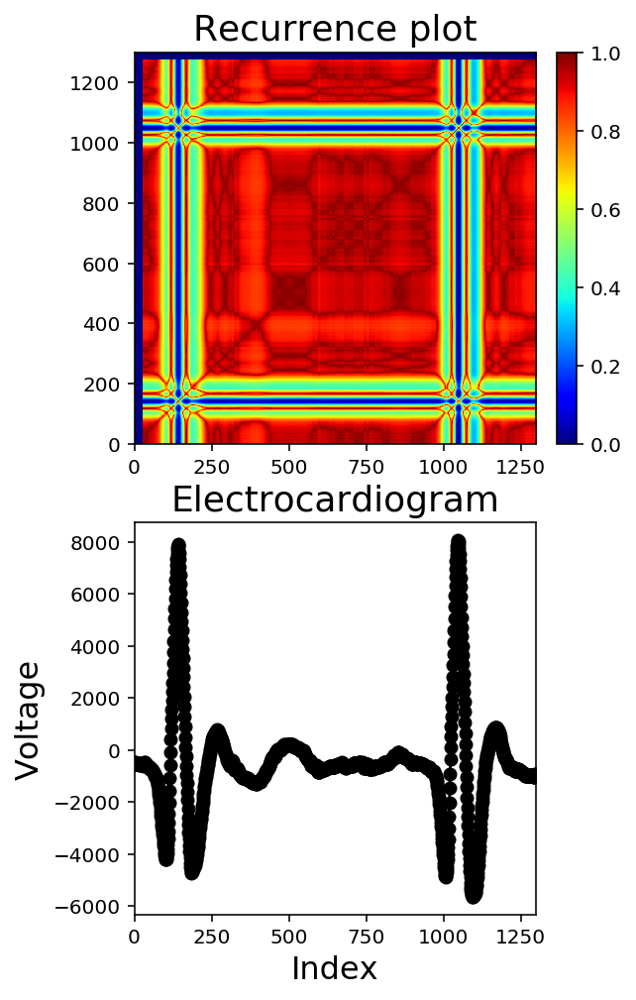

Subject 5


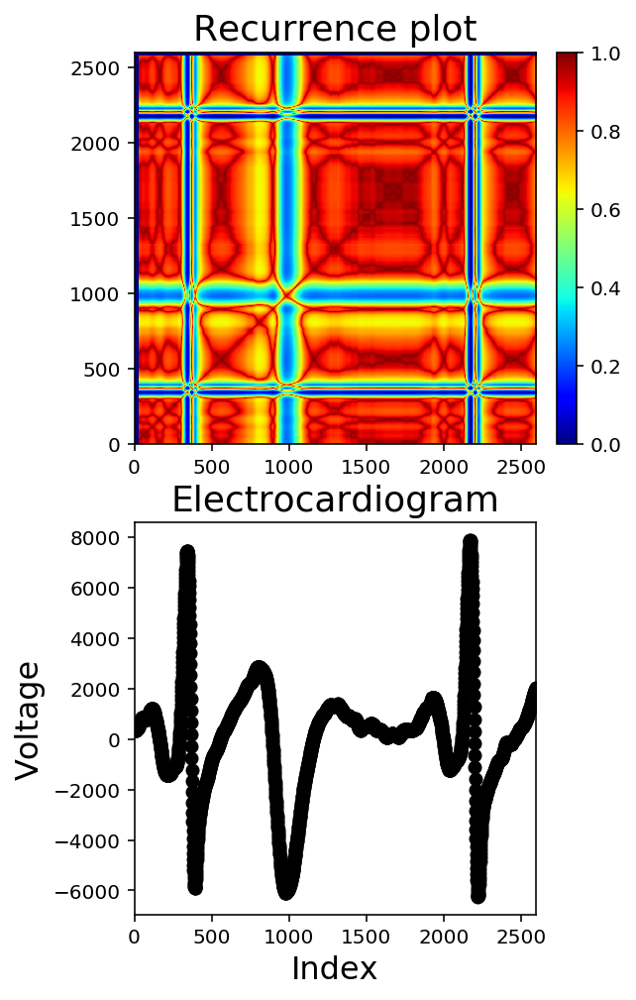

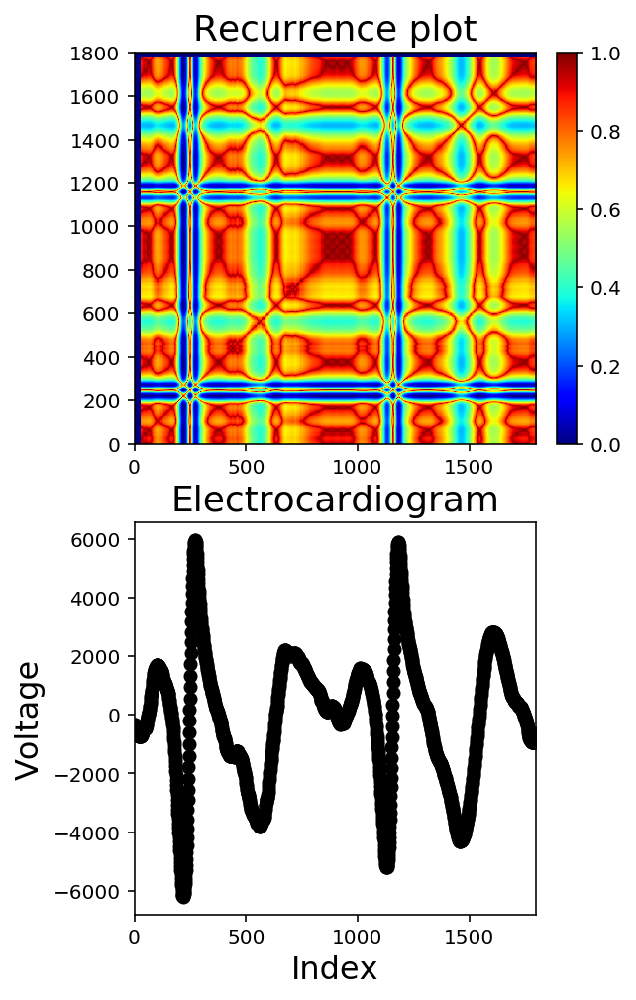

Subject 6


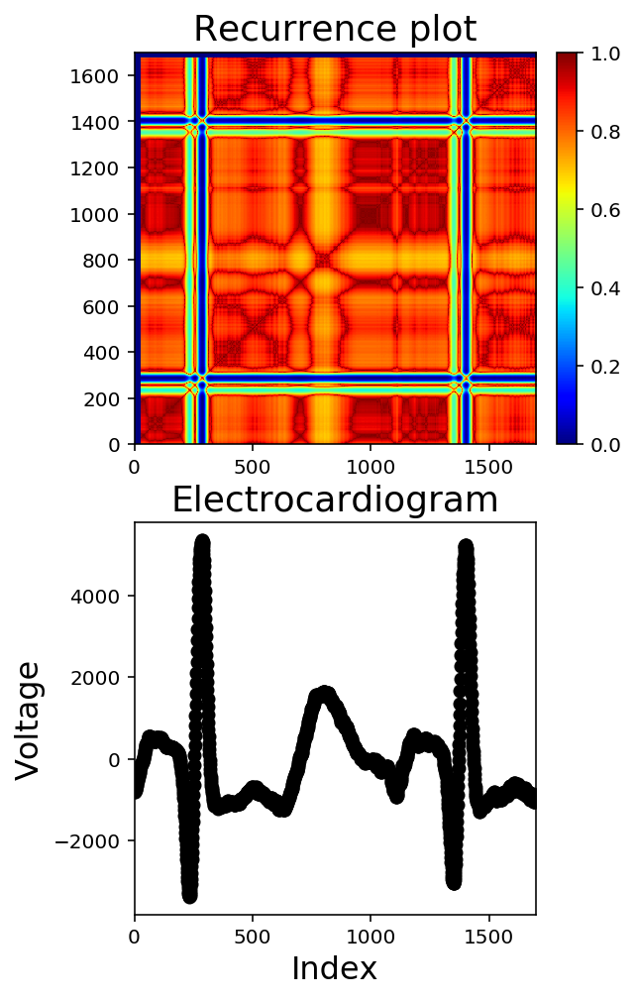

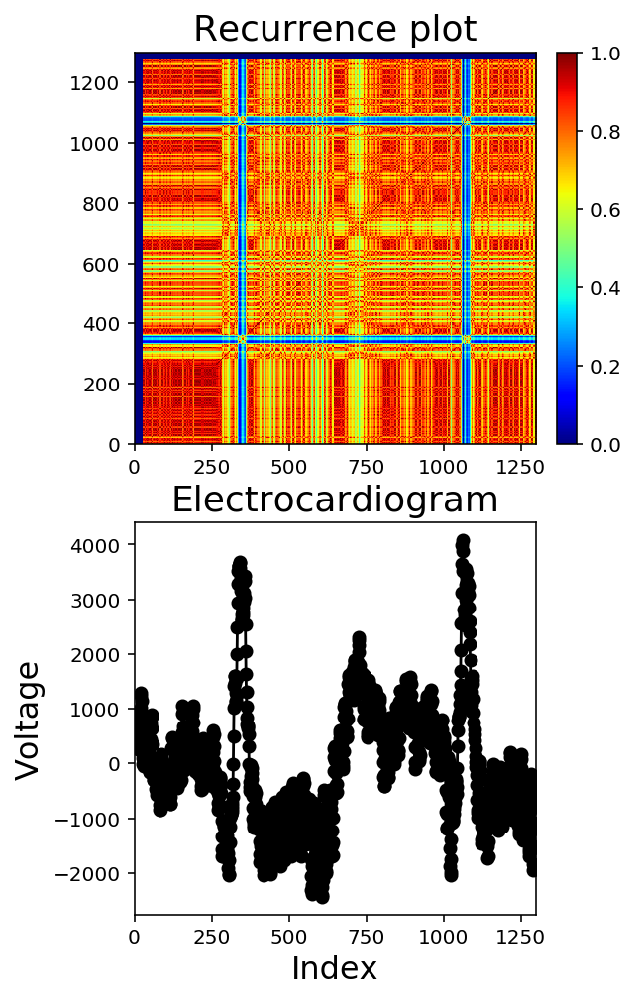

Subject 7


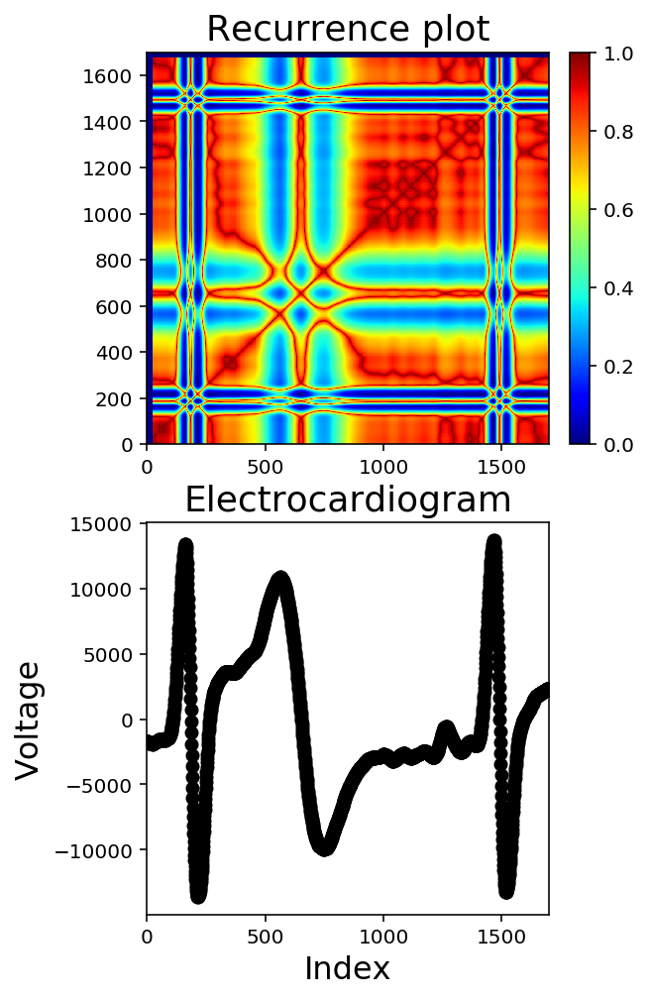

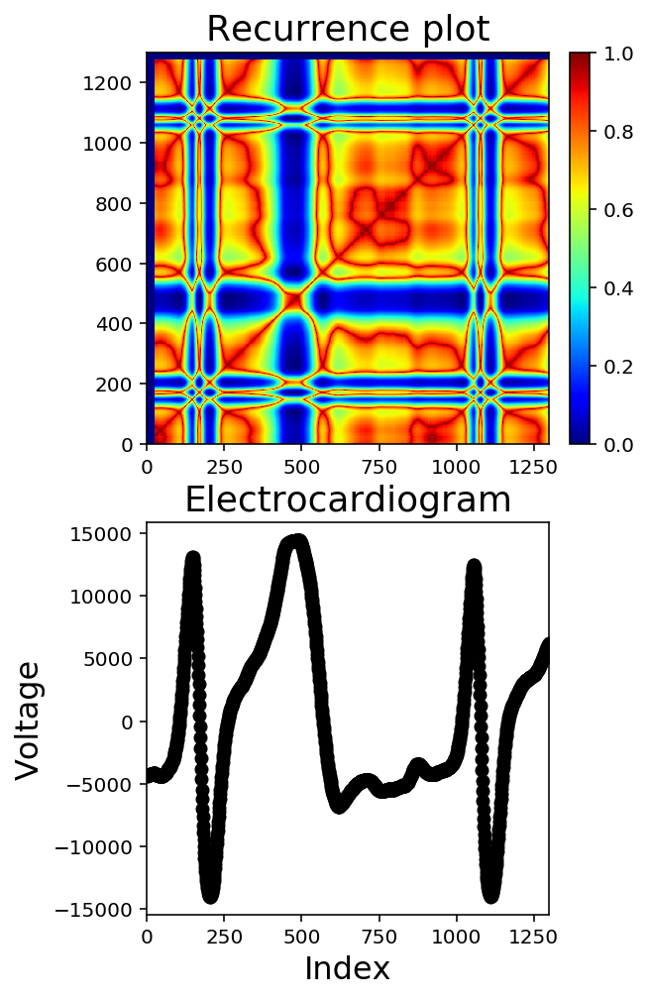

In [38]:
for i in range(0, 7):
    print("Subject " + str(i+1))
    graph_recurrence(waveData_rest_surrogates[i], index_surrogate_rest[i],
                     normal_euclid_rest[i])
    graph_recurrence(waveData_exer_surrogates[i], index_surrogate_exer[i],
                     normal_euclid_exer[i])

Let's visualize side by side in this technique the comparison with rest or after exercise.

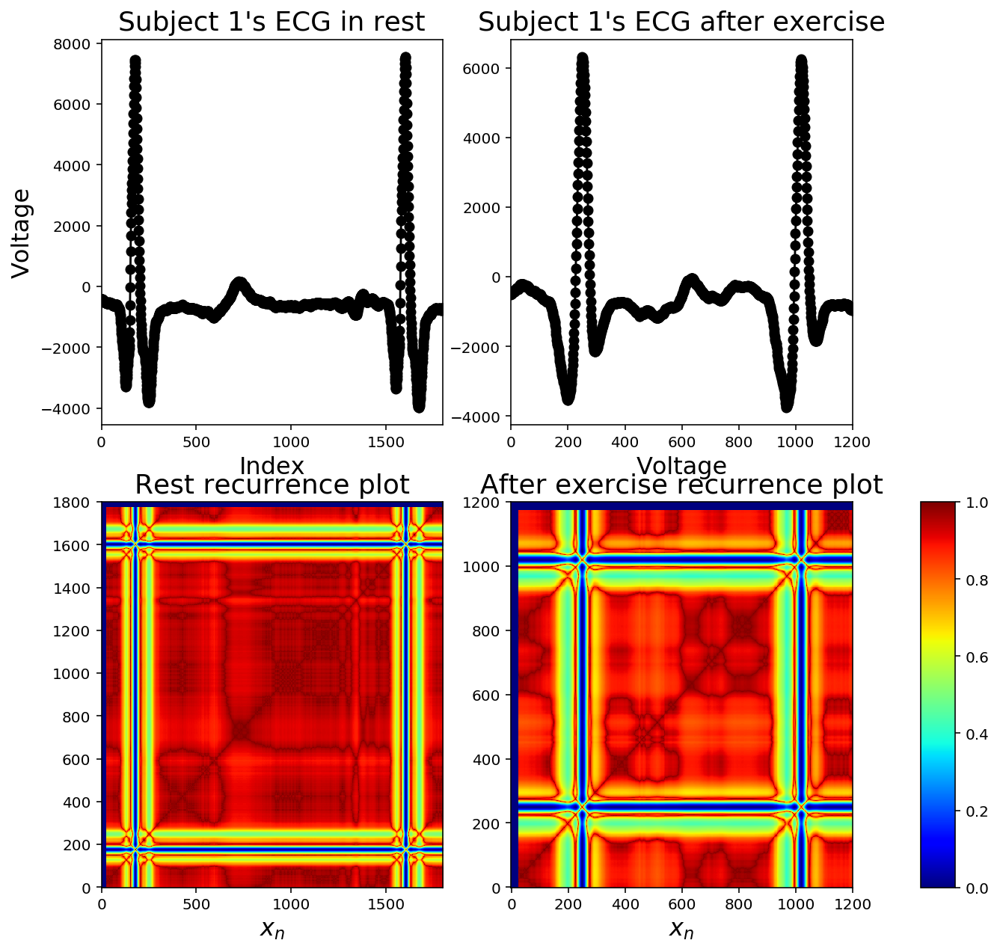

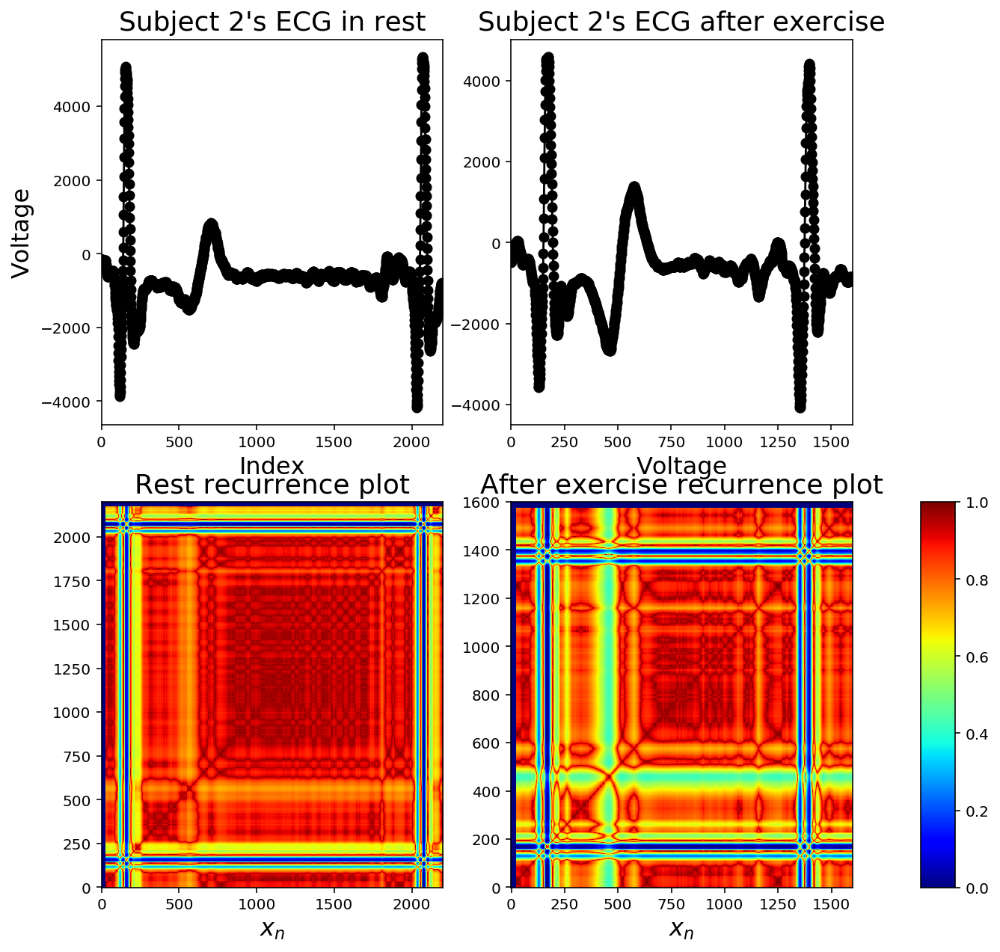

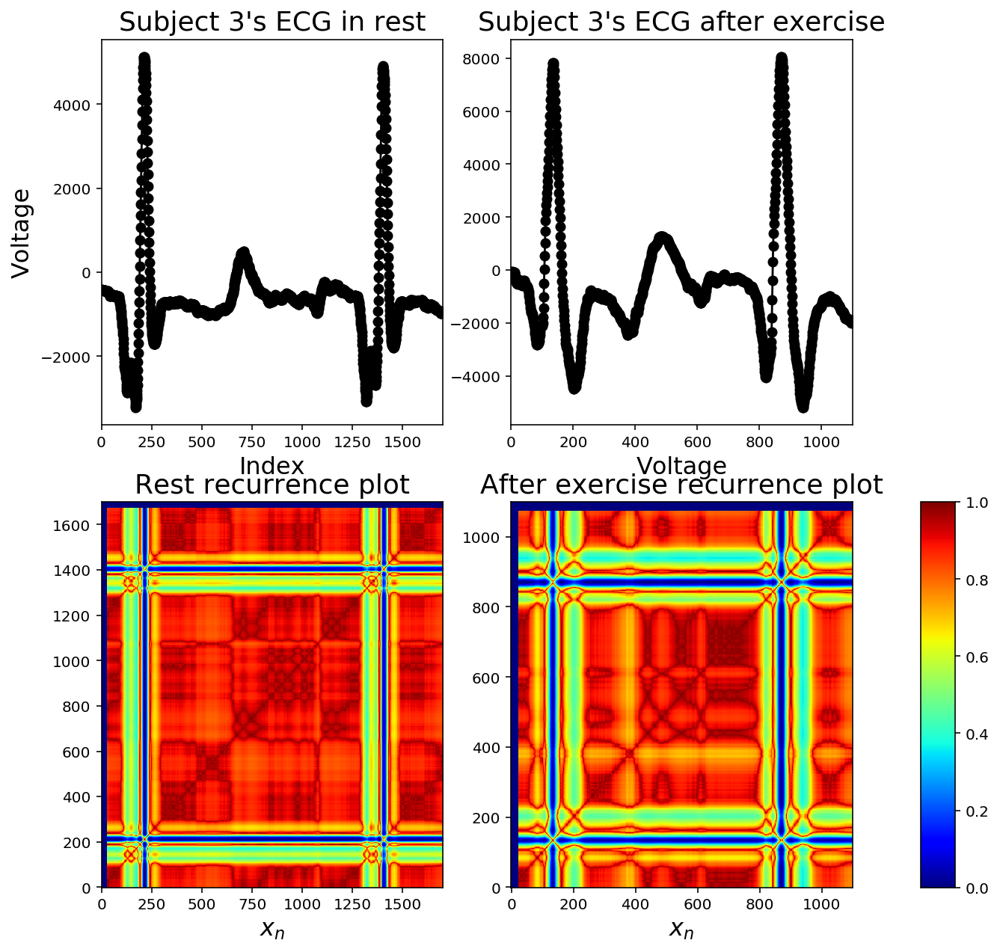

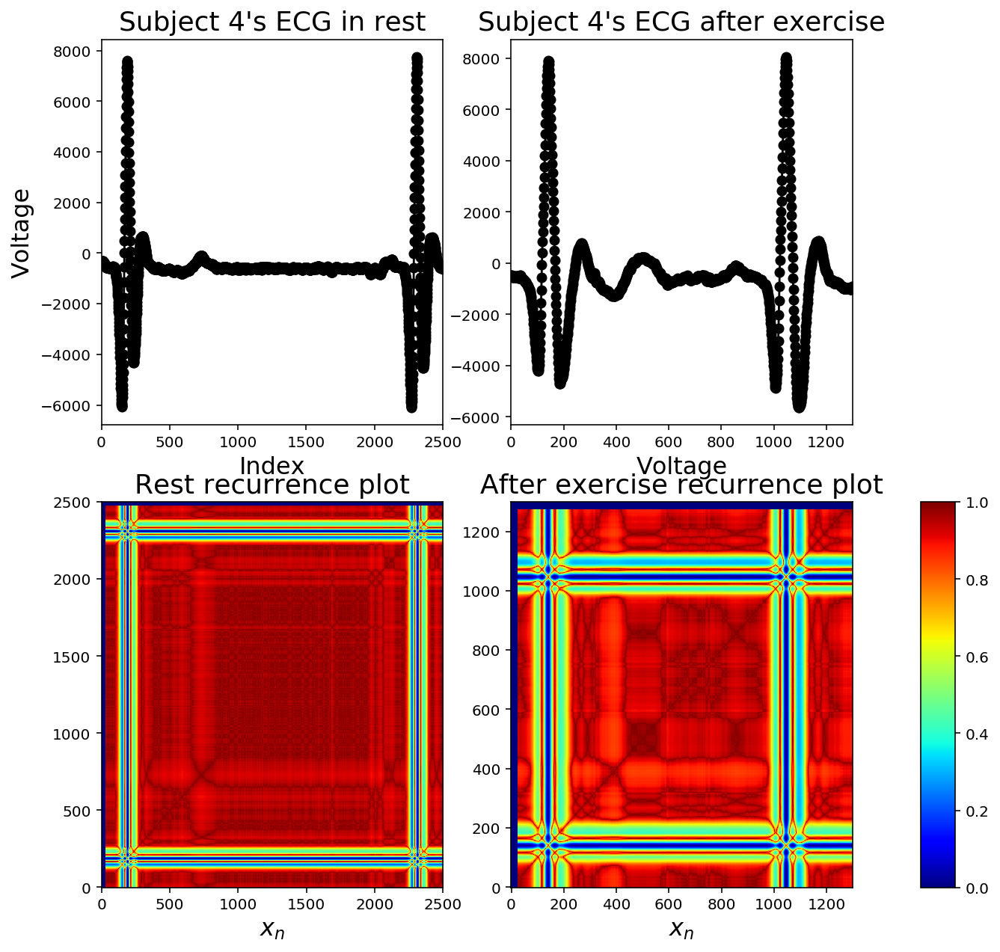

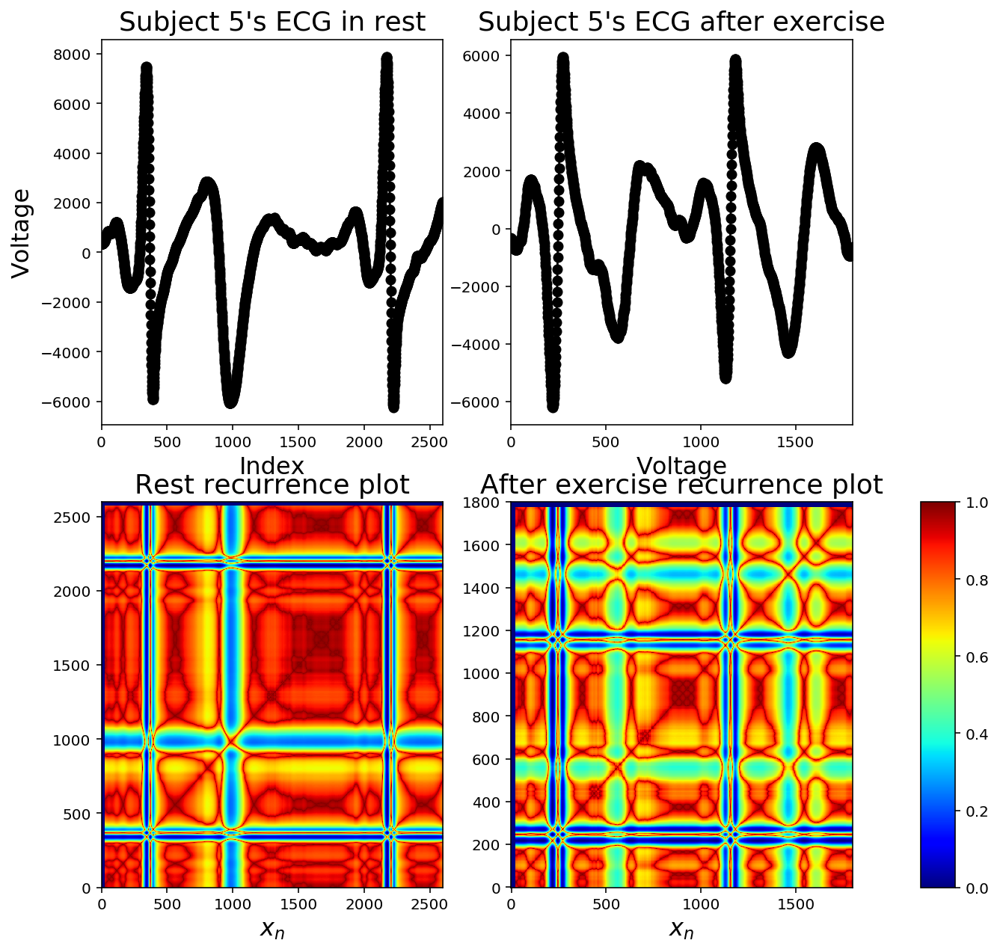

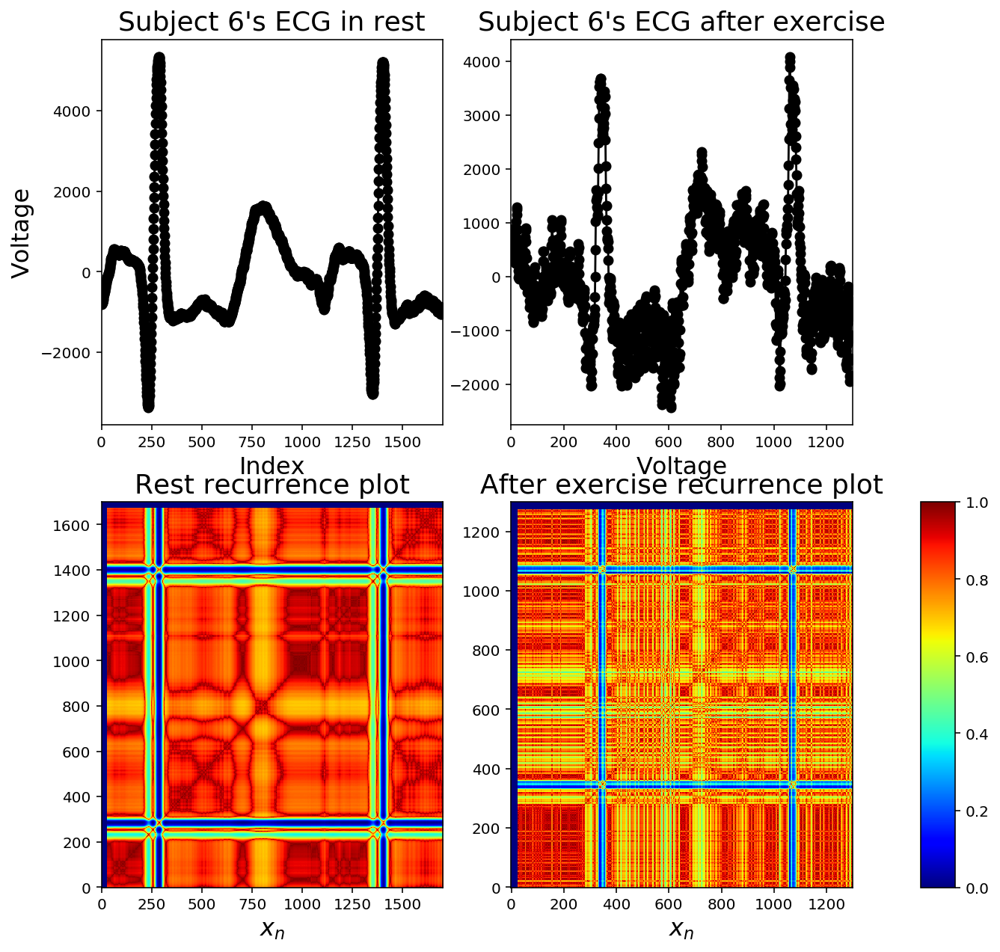

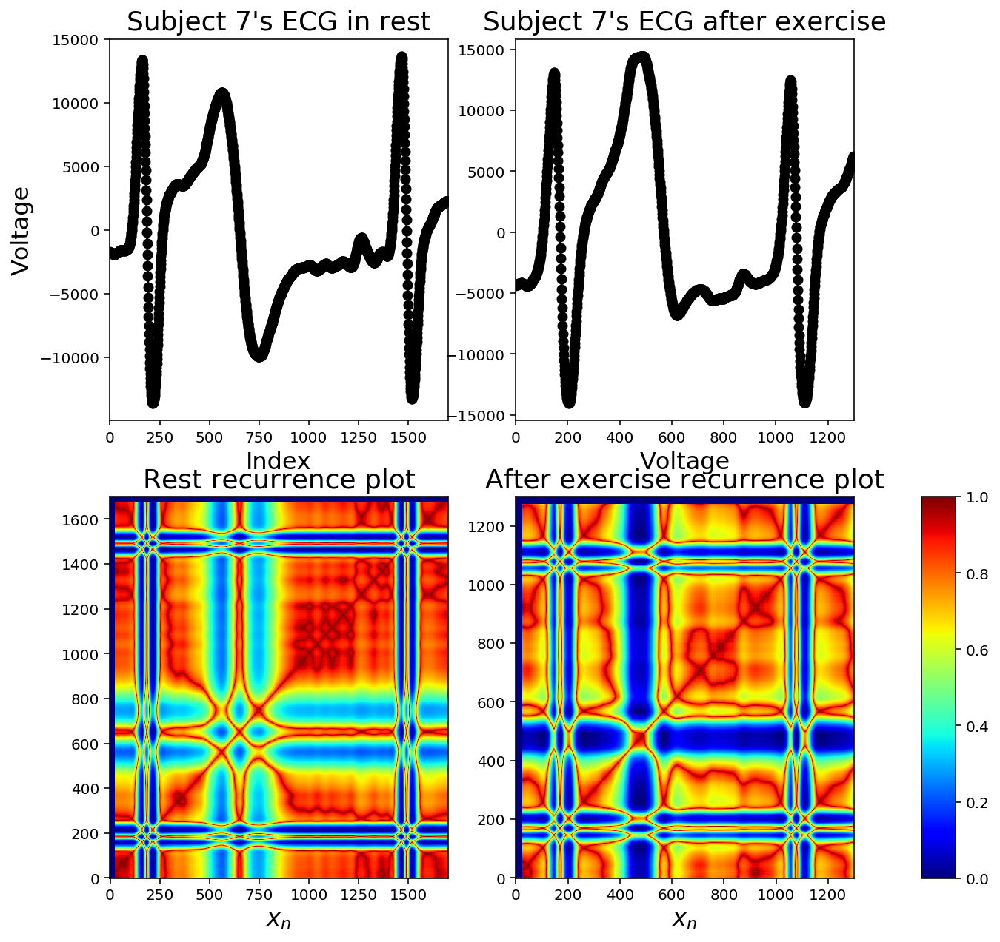

In [39]:
for i in range(0, 7):
    fig, axs = plt.subplots(2,2,figsize=(9,9)) #figsize=(6,8)

    axs[0, 0].plot(index_surrogate_rest[i], waveData_rest_surrogates[i],
                   marker="o", c="k")
    axs[0, 0].set_title("Subject "+str(i+1)+"'s ECG in rest")
    axs[0, 0].set_xlabel("Index")
    axs[0, 0].set_ylabel("Voltage")
    axs[0, 0].set_xlim(0, len(index_surrogate_rest[i]))

    axs[0, 1].plot(index_surrogate_exer[i], waveData_exer_surrogates[i],
                   marker="o", c="k")
    axs[0, 1].set_title("Subject "+str(i+1)+"'s ECG after exercise")
    axs[0, 1].set_xlabel("Index")
    axs[0, 1].set_xlabel("Voltage")
    axs[0, 1].set_xlim(0, len(index_surrogate_exer[i]))

    plot = axs[1, 0].imshow(normal_euclid_rest[i], origin='lower',
                            aspect="auto", cmap="jet")
    axs[1, 0].set_title("Rest recurrence plot")
    axs[1, 0].set_xlabel(r"$x_n$")
    axins = inset_axes(axs[1,0],
                   width="10%", # width = 10% of parent_bbox width
                   height="100%", # height : 50%
                   loc=6,
                   bbox_to_anchor=(2.4, 0, 1, 1),
                   bbox_transform=axs[1,0].transAxes,
                   borderpad=0,)

    axs[1, 1].imshow(normal_euclid_exer[i], origin='lower', aspect="auto", cmap="jet")
    axs[1, 1].set_title("After exercise recurrence plot")
    axs[1, 1].set_xlabel(r"$x_n$")

    cbar = plt.colorbar(plot, cax=axins)
    fig.subplots_adjust(top=1)

In subject 1 we have the best recording of this small sample data. Notice how at a resting state we observe more random fluctuations around baseline and in the after exercise recording we observe more artifacts in these amplitude changes. The P and T wave are not clearly distinguishable in the recording. In the recurrence plot these amplitude changes are clearly observed because of pattern emergence. Also, notice how the overall red color in the plot diminishes when the individual does exercise. This is because in the reucrrence plot, points lie overall farther away from each other.

In subject 2 we also see a change in the amplitude of the T wave. This is seen in the recurrence plot by a band of 0.4 that is light blue.

Subject 3 and 4 can be interpreted similar to subject 1. The recurrence plot has a certain pattern when the subject is at rest. This pattern changes after the subject performs exercise. And the recurrence plot when the individual is at rest looks like a recurrence plot of white noise, except for the moments when a QRS complex occurs.

In subject 5 the presence of artifacts is substantial. Notice how the recurrence plot technique is very sensitive to these artefacts. We did not make a close up of the ECG signal until now. Notice in subject 5 how the ECG signal does not correspond to the common heart singal. In the QRS complex there is a fast increase in the signal followed by a fast decrease, when there should be first a fast decrease followed by a sharp increase. This is just a sign that when recording this signal, the electrodes were exchanged. Besides, notice the big changes in the signal's amplitude between QRS complexes. This is just a sign of a bad recording.

In subject 6 after exercise, we observe a lot of noise in the recording. In this example there was 60 Hz noise. This noise is clearly observed in the recurrence plot.

In subject 7 we observe that the T wave is huge, almost of the same amplitude as the QRS peak. This is an artefact which is exacerbated in the recurrence plot. We observe a blue region in the recurrence plot when the T wave occurs in the ECG.

# Final remarks
As you have seen in this notebook, it is not always valid to use certain techniques nor recordings. There are certain conditions that must be met before we can use these techniques. Besides, recordings must fulfill certain data criteria for being able to perform data analysis with them.

# Poincaré plots of the previos NB version

In [ ]:
# Poincare plots

colors = ['blue', 'red', 'black', 'purple', "orange","green"]
identifiers = ["Control", "Aguantando la respiración pecho", "Respiraciones profundas 55 pecho",
"4.- Aguantando la respiración abdomen", "5.- Respiraciones profundas 55 abdomen", "6.- Respiración en ola"]
    
#Poincare plots of all the values
plt.figure(figsize=(8,8))
plt.title("Poincare plot")
plt.xlim(0,1.2)
plt.ylim(0,1.2)

for j in range(0, len(InputPaths)):
    if j == 0:
        poincare_arrays = poincare_array1
    elif j == 1:
        poincare_arrays = poincare_array2
    elif j == 2:
        poincare_arrays = poincare_array3
    elif j == 3:
        poincare_arrays = poincare_array4
    elif j == 4:
        poincare_arrays = poincare_array5
    elif j == 5:
        poincare_arrays = poincare_array6
    
    for i in range(0, len(poincare_arrays)):

        xx = poincare_arrays[i]

        plt.scatter(xx[1:-1], xx[:-2], s = 4, c = colors[j], label = identifiers[j])
        
plt.legend(loc='upper right', bbox_to_anchor=(1.8, 1.05))
plt.show()

En las siguientes celdas hay un problema con los colores y la leyenda

In [ ]:
# Poincare plots

colors = ['blue', 'red', 'black', 'purple', "orange","green"]
identifiers = ["1 Control", "2 Aguantando la respiración pecho", "3 Respiraciones profundas 55 pecho",
"4.- Aguantando la respiración abdomen", "5.- Respiraciones profundas 55 abdomen", "6.- Respiración en ola"]
    
#Poincare plots of all the values
plt.figure(figsize=(8,8))
plt.title("Poincare plot")
plt.xlim(0,1.2)
plt.ylim(0,1.2)

for j in range(0, len(InputPaths)):
    if j == 0:
        poincare_arrays = poincare_array1
    elif j == 1:
        poincare_arrays = poincare_array2
#     elif j == 2:
#         poincare_arrays = poincare_array3
    elif j == 3:
        poincare_arrays = poincare_array4
#     elif j == 4:
#         poincare_arrays = poincare_array5
#     elif j == 5:
#         poincare_arrays = poincare_array6
    if poincare_arrays != []:
        for i in range(0, len(poincare_arrays)):

            xx = poincare_arrays[i]

            plt.scatter(xx[1:-1], xx[:-2], s = 4, c = colors[j], label = identifiers[j])
        poincare_arrays = []
        
plt.legend(loc='upper right', bbox_to_anchor=(1.8, 1.05))
plt.show()

In [ ]:
# Poincare plots

colors = ['blue', 'red', 'black', 'purple', "orange","green"]
identifiers = ["1 Control", "2 Aguantando la respiración pecho", "3 Respiraciones profundas 55 pecho",
"4.- Aguantando la respiración abdomen", "5.- Respiraciones profundas 55 abdomen", "6.- Respiración en ola"]
    
#Poincare plots of all the values
plt.figure(figsize=(8,8))
plt.title("Poincare plot")
plt.xlim(0,1.2)
plt.ylim(0,1.2)

for j in range(0, len(InputPaths)):
    if j == 0:
        poincare_arrays = poincare_array1
#     elif j == 1:
#         poincare_arrays = poincare_array2
    elif j == 2:
        poincare_arrays = poincare_array3
#     elif j == 3:
#         poincare_arrays = poincare_array4
    elif j == 4:
        poincare_arrays = poincare_array5
    elif j == 5:
        poincare_arrays = poincare_array6
    
    if poincare_arrays != []:
        for i in range(0, len(poincare_arrays)):

            xx = poincare_arrays[i]

            plt.scatter(xx[1:-1], xx[:-2], s = 4, c = colors[j], label = identifiers[j])
        poincare_arrays = []
        
plt.legend(loc='upper right', bbox_to_anchor=(1.8, 1.05))
plt.show()

Techniques 3, 5 and 6 make the R R intervals change. Very interesting what happens to the heartbeat while meditating!

Interpretación: Al someter al cuerpo bajo un esfuerzo físico, los intervalos R-R Se vuelven más regulares y el corazón comienza a asemejarse a un reloj. Tanto sus intervalos entre latidos se vuelven más regulares y aumenta la frecuencia de los picos R.

Sin embargo, si nos enfocamos en el comportamiento de la onda completa después de hacer ejercicio, se observa que la correlación entre un punto de la señal y la siguiente no es tan semejante que cuando se está en reposo. La idea de que las trayectorias "spread out" en el espacio fase.